# Insurance Claims- Fraud Detection


### Problem Statement:


   #### Business case:
        - Insurance fraud is a huge problem in the industry. It's difficult to identify fraud claims. Machine Learning is in a unique position to help the Auto Insurance industry with this problem.

        - In this project, you are provided a dataset which has the details of the insurance policy along with the customer details. It also has the details of the accident on the basis of which the claims have been made. 

        - In this example, you will be working with some auto insurance data to demonstrate how you can create a predictive model that predicts if an insurance claim is fraudulent or not. 

 

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
pd.options.display.max_columns=None
import warnings
warnings.filterwarnings('ignore')

In [2]:
df = pd.read_csv('Automobile_insurance_fraud.csv')
df

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,MALE,MD,craft-repair,sleeping,husband,53300,0,25-01-2015,Single Vehicle Collision,Side Collision,Major Damage,Police,SC,Columbus,9935 4th Drive,5,1,YES,1,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y,NaN
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,MALE,MD,machine-op-inspct,reading,other-relative,0,0,21-01-2015,Vehicle Theft,?,Minor Damage,Police,VA,Riverwood,6608 MLK Hwy,8,1,?,0,0,?,5070,780,780,3510,Mercedes,E400,2007,Y,NaN
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,FEMALE,PhD,sales,board-games,own-child,35100,0,22-02-2015,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,NY,Columbus,7121 Francis Lane,7,3,NO,2,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,NaN
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,FEMALE,PhD,armed-forces,board-games,unmarried,48900,-62400,10-01-2015,Single Vehicle Collision,Front Collision,Major Damage,Police,OH,Arlington,6956 Maple Drive,5,1,?,1,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,NaN
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,MALE,Associate,sales,board-games,unmarried,66000,-46000,17-02-2015,Vehicle Theft,?,Minor Damage,None,NY,Arlington,3041 3rd Ave,20,1,NO,0,1,NO,6500,1300,650,4550,Accura,RSX,2009,N,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,941851,16-07-1991,OH,500/1000,1000,1310.80,0,431289,FEMALE,Masters,craft-repair,paintball,unmarried,0,0,22-02-2015,Single Vehicle Collision,Front Collision,Minor Damage,Fire,NC,Northbrook,6045 Andromedia St,20,1,YES,0,1,?,87200,17440,8720,61040,Honda,Accord,2006,N,NaN
996,285,41,186934,05-01-2014,IL,100/300,1000,1436.79,0,608177,FEMALE,PhD,prof-specialty,sleeping,wife,70900,0,24-01-2015,Single Vehicle Collision,Rear Collision,Major Damage,Fire,SC,Northbend,3092 Texas Drive,23,1,YES,2,3,?,108480,18080,18080,72320,Volkswagen,Passat,2015,N,NaN
997,130,34,918516,17-02-2003,OH,250/500,500,1383.49,3000000,442797,FEMALE,Masters,armed-forces,bungie-jumping,other-relative,35100,0,23-01-2015,Multi-vehicle Collision,Side Collision,Minor Damage,Police,NC,Arlington,7629 5th St,4,3,?,2,3,YES,67500,7500,7500,52500,Suburu,Impreza,1996,N,NaN
998,458,62,533940,18-11-2011,IL,500/1000,2000,1356.92,5000000,441714,MALE,Associate,handlers-cleaners,base-jumping,wife,0,0,26-02-2015,Single Vehicle Collision,Rear Collision,Major Damage,Other,NY,Arlington,6128 Elm Lane,2,1,?,0,1,YES,46980,5220,5220,36540,Audi,A5,1998,N,NaN


In [3]:
df.isnull().sum()

months_as_customer                0
age                               0
policy_number                     0
policy_bind_date                  0
policy_state                      0
policy_csl                        0
policy_deductable                 0
policy_annual_premium             0
umbrella_limit                    0
insured_zip                       0
insured_sex                       0
insured_education_level           0
insured_occupation                0
insured_hobbies                   0
insured_relationship              0
capital-gains                     0
capital-loss                      0
incident_date                     0
incident_type                     0
collision_type                    0
incident_severity                 0
authorities_contacted             0
incident_state                    0
incident_city                     0
incident_location                 0
incident_hour_of_the_day          0
number_of_vehicles_involved       0
property_damage             

We see we do not have any null values in any column other than '_c39' where we have 1000 Null values, hence we could drop that column.

In [4]:
df.drop('_c39',axis=1,inplace=True)

In [5]:
df.nunique()

months_as_customer              391
age                              46
policy_number                  1000
policy_bind_date                951
policy_state                      3
policy_csl                        3
policy_deductable                 3
policy_annual_premium           991
umbrella_limit                   11
insured_zip                     995
insured_sex                       2
insured_education_level           7
insured_occupation               14
insured_hobbies                  20
insured_relationship              6
capital-gains                   338
capital-loss                    354
incident_date                    60
incident_type                     4
collision_type                    4
incident_severity                 4
authorities_contacted             5
incident_state                    7
incident_city                     7
incident_location              1000
incident_hour_of_the_day         24
number_of_vehicles_involved       4
property_damage             

In [6]:
for i in df.columns:
    uni = df[i].unique()
    uni.sort()
    print(i,':')
    print(uni)
    print()
    print('*'*100)

months_as_customer :
[  0   1   2   3   4   5   6   7   8   9  10  11  12  13  14  15  16  17
  19  20  22  24  25  26  27  29  30  31  32  33  34  35  36  37  38  39
  40  41  43  45  46  47  48  50  51  53  54  55  56  57  58  59  60  61
  62  63  64  65  66  67  69  70  72  73  75  76  77  78  79  80  81  82
  83  84  85  86  87  88  89  90  91  92  93  94  95  96  97  98  99 100
 101 102 103 104 105 106 107 108 109 110 111 112 113 114 115 116 117 118
 119 120 121 122 123 124 125 126 127 128 129 130 131 132 133 134 135 136
 137 138 140 141 142 143 144 145 146 147 148 149 150 151 152 153 154 155
 156 157 158 159 160 161 162 163 164 165 166 167 168 169 171 172 173 174
 175 176 177 178 179 180 182 183 184 185 186 187 188 189 190 191 192 193
 194 195 196 197 198 199 200 201 202 203 204 205 206 207 208 209 210 211
 212 213 214 215 216 217 218 219 220 222 223 224 225 227 228 229 230 231
 232 233 234 235 236 237 238 239 240 241 242 243 244 245 246 247 249 250
 251 252 253 254 255 256 257 2

we have '?' as some values in 'collision_type','property_damage','police_report_available'.

In [7]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 39 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           1000 non-null   int64  
 1   age                          1000 non-null   int64  
 2   policy_number                1000 non-null   int64  
 3   policy_bind_date             1000 non-null   object 
 4   policy_state                 1000 non-null   object 
 5   policy_csl                   1000 non-null   object 
 6   policy_deductable            1000 non-null   int64  
 7   policy_annual_premium        1000 non-null   float64
 8   umbrella_limit               1000 non-null   int64  
 9   insured_zip                  1000 non-null   int64  
 10  insured_sex                  1000 non-null   object 
 11  insured_education_level      1000 non-null   object 
 12  insured_occupation           1000 non-null   object 
 13  insured_hobbies    

In [8]:
df.describe()

,months_as_customer,age,policy_number,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_year
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1.000000e+03,1000.000000,1000.000000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.000000,1000.000000
mean,203.954000,38.948000,546238.648000,1136.000000,1256.406150,1.101000e+06,501214.488000,25126.100000,-26793.700000,11.644000,1.83900,0.992000,1.487000,52761.94000,7433.420000,7399.570000,37928.950000,2005.103000
std,115.113174,9.140287,257063.005276,611.864673,244.167395,2.297407e+06,71701.610941,27872.187708,28104.096686,6.951373,1.01888,0.820127,1.111335,26401.53319,4880.951853,4824.726179,18886.252893,6.015861
min,0.000000,19.000000,100804.000000,500.000000,433.330000,-1.000000e+06,430104.000000,0.000000,-111100.000000,0.000000,1.00000,0.000000,0.000000,100.00000,0.000000,0.000000,70.000000,1995.000000
25%,115.750000,32.000000,335980.250000,500.000000,1089.607500,0.000000e+00,448404.500000,0.000000,-51500.000000,6.000000,1.00000,0.000000,1.000000,41812.50000,4295.000000,4445.000000,30292.500000,2000.000000
50%,199.500000,38.000000,533135.000000,1000.000000,1257.200000,0.000000e+00,466445.500000,0.000000,-23250.000000,12.000000,1.00000,1.000000,1.000000,58055.00000,6775.000000,6750.000000,42100.000000,2005.000000
75%,276.250000,44.000000,759099.750000,2000.000000,1415.695000,0.000000e+00,603251.000000,51025.000000,0.000000,17.000000,3.00000,2.000000,2.000000,70592.50000,11305.000000,10885.000000,50822.500000,2010.000000
max,479.000000,64.000000,999435.000000,2000.000000,2047.590000,1.000000e+07,620962.000000,100500.000000,0.000000,23.000000,4.00000,2.000000,3.000000,114920.00000,21450.000000,23670.000000,79560.000000,2015.000000


### Working on values containing '?'

##### 'collision_type'

In [9]:
df[df['collision_type']=='?']

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,MALE,MD,machine-op-inspct,reading,other-relative,0,0,21-01-2015,Vehicle Theft,?,Minor Damage,Police,VA,Riverwood,6608 MLK Hwy,8,1,?,0,0,?,5070,780,780,3510,Mercedes,E400,2007,Y
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,MALE,Associate,sales,board-games,unmarried,66000,-46000,17-02-2015,Vehicle Theft,?,Minor Damage,None,NY,Arlington,3041 3rd Ave,20,1,NO,0,1,NO,6500,1300,650,4550,Accura,RSX,2009,N
13,121,34,626808,26-10-2012,OH,100/300,1000,936.61,0,464652,FEMALE,MD,armed-forces,bungie-jumping,wife,52800,-32800,08-01-2015,Parked Car,?,Minor Damage,None,SC,Springfield,6582 Elm Lane,5,1,NO,1,1,NO,7280,1120,1120,5040,Toyota,Highlander,2010,N
26,257,43,863236,20-09-1990,IN,100/300,2000,1322.10,0,436984,MALE,High School,prof-specialty,golf,own-child,0,-29200,28-01-2015,Parked Car,?,Minor Damage,Police,PA,Arlington,2533 Elm St,4,1,YES,1,3,YES,9020,1640,820,6560,Toyota,Camry,2005,N
27,202,34,608513,18-07-2002,IN,100/300,500,848.07,3000000,607730,MALE,JD,exec-managerial,chess,not-in-family,31000,-30200,07-01-2015,Vehicle Theft,?,Minor Damage,None,VA,Northbrook,3790 Andromedia Hwy,5,1,YES,2,1,?,5720,1040,520,4160,Suburu,Forrestor,2003,Y
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
964,163,37,390256,25-11-2009,IN,500/1000,1000,1200.33,4000000,477631,FEMALE,High School,craft-repair,cross-fit,own-child,0,-36400,06-02-2015,Vehicle Theft,?,Minor Damage,Police,WV,Springfield,6702 Andromedia St,7,1,?,2,1,YES,3900,390,780,2730,Volkswagen,Jetta,2008,Y
969,398,55,844062,25-05-1990,OH,250/500,500,862.19,0,606858,MALE,High School,adm-clerical,movies,unmarried,69400,0,23-02-2015,Vehicle Theft,?,Trivial Damage,Police,SC,Northbend,8167 Apache Ave,7,1,?,2,3,?,6600,600,1200,4800,Accura,MDX,2012,N
983,17,39,774895,28-10-2006,IL,250/500,1000,840.95,0,431202,FEMALE,JD,adm-clerical,hiking,unmarried,32500,-80800,26-02-2015,Parked Car,?,Trivial Damage,Police,SC,Arlington,7042 Maple Ridge,9,1,?,2,1,?,3440,430,430,2580,Suburu,Legacy,2002,N
994,141,30,681486,24-03-2007,IN,500/1000,1000,1347.04,0,430665,MALE,High School,sales,bungie-jumping,own-child,0,-82100,22-01-2015,Parked Car,?,Minor Damage,None,SC,Northbend,6516 Solo Drive,6,1,?,1,2,YES,6480,540,1080,4860,Honda,Civic,1996,N


In [10]:
Incident_collusion = df.pivot_table(values='collision_type',index='incident_type',aggfunc=(lambda x:x.mode()))
Incident_collusion

,collision_type
incident_type,
Multi-vehicle Collision,"[Rear Collision, Side Collision]"
Parked Car,?
Single Vehicle Collision,Rear Collision
Vehicle Theft,?


In [11]:
df['collision_type'].mode()

0    Rear Collision
dtype: object

#### From above we see that the Vehicle stolen have all the values as '?', and replacing it with mode 'Rear Collision' would not be right. Hence creating another category as Other Damages in collision_type

In [12]:
num = []
for i in range(len(df)):
    if df['incident_type'].iloc[i] == 'Vehicle Theft':
        num.append(i)

In [13]:
df['incident_type'].value_counts()

Multi-vehicle Collision     419
Single Vehicle Collision    403
Vehicle Theft                94
Parked Car                   84
Name: incident_type, dtype: int64

In [14]:
df['collision_type'].loc[num] = df['collision_type'].loc[num].replace('?','Other Damages')

In [15]:
num = []
for i in range(len(df)):
    if df['incident_type'].iloc[i] == 'Parked Car':
        num.append(i)

In [16]:
df['collision_type'].loc[num]= df['collision_type'].loc[num].replace('?','Rear Collision')

In [17]:
df

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,MALE,MD,craft-repair,sleeping,husband,53300,0,25-01-2015,Single Vehicle Collision,Side Collision,Major Damage,Police,SC,Columbus,9935 4th Drive,5,1,YES,1,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,MALE,MD,machine-op-inspct,reading,other-relative,0,0,21-01-2015,Vehicle Theft,Other Damages,Minor Damage,Police,VA,Riverwood,6608 MLK Hwy,8,1,?,0,0,?,5070,780,780,3510,Mercedes,E400,2007,Y
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,FEMALE,PhD,sales,board-games,own-child,35100,0,22-02-2015,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,NY,Columbus,7121 Francis Lane,7,3,NO,2,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,FEMALE,PhD,armed-forces,board-games,unmarried,48900,-62400,10-01-2015,Single Vehicle Collision,Front Collision,Major Damage,Police,OH,Arlington,6956 Maple Drive,5,1,?,1,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,MALE,Associate,sales,board-games,unmarried,66000,-46000,17-02-2015,Vehicle Theft,Other Damages,Minor Damage,None,NY,Arlington,3041 3rd Ave,20,1,NO,0,1,NO,6500,1300,650,4550,Accura,RSX,2009,N
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,941851,16-07-1991,OH,500/1000,1000,1310.80,0,431289,FEMALE,Masters,craft-repair,paintball,unmarried,0,0,22-02-2015,Single Vehicle Collision,Front Collision,Minor Damage,Fire,NC,Northbrook,6045 Andromedia St,20,1,YES,0,1,?,87200,17440,8720,61040,Honda,Accord,2006,N
996,285,41,186934,05-01-2014,IL,100/300,1000,1436.79,0,608177,FEMALE,PhD,prof-specialty,sleeping,wife,70900,0,24-01-2015,Single Vehicle Collision,Rear Collision,Major Damage,Fire,SC,Northbend,3092 Texas Drive,23,1,YES,2,3,?,108480,18080,18080,72320,Volkswagen,Passat,2015,N
997,130,34,918516,17-02-2003,OH,250/500,500,1383.49,3000000,442797,FEMALE,Masters,armed-forces,bungie-jumping,other-relative,35100,0,23-01-2015,Multi-vehicle Collision,Side Collision,Minor Damage,Police,NC,Arlington,7629 5th St,4,3,?,2,3,YES,67500,7500,7500,52500,Suburu,Impreza,1996,N
998,458,62,533940,18-11-2011,IL,500/1000,2000,1356.92,5000000,441714,MALE,Associate,handlers-cleaners,base-jumping,wife,0,0,26-02-2015,Single Vehicle Collision,Rear Collision,Major Damage,Other,NY,Arlington,6128 Elm Lane,2,1,?,0,1,YES,46980,5220,5220,36540,Audi,A5,1998,N


##### 'property_damage'	

In [18]:
df['property_damage'].value_counts()

?      360
NO     338
YES    302
Name: property_damage, dtype: int64

Replacing the '?' values in 'property_damage' with 'No'

In [19]:
df['property_damage'] = df['property_damage'].replace('?','NO')

In [20]:
df['property_damage'].value_counts()

NO     698
YES    302
Name: property_damage, dtype: int64

##### 'police_report_available'

In [21]:
df['police_report_available'].value_counts()

?      343
NO     343
YES    314
Name: police_report_available, dtype: int64

Replacing "?" with No in 'police_report_available'

In [22]:
df['police_report_available'] = df['police_report_available'].replace('?','NO')

In [23]:
df['police_report_available'].value_counts()

NO     686
YES    314
Name: police_report_available, dtype: int64

In [24]:
df

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,MALE,MD,craft-repair,sleeping,husband,53300,0,25-01-2015,Single Vehicle Collision,Side Collision,Major Damage,Police,SC,Columbus,9935 4th Drive,5,1,YES,1,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,MALE,MD,machine-op-inspct,reading,other-relative,0,0,21-01-2015,Vehicle Theft,Other Damages,Minor Damage,Police,VA,Riverwood,6608 MLK Hwy,8,1,NO,0,0,NO,5070,780,780,3510,Mercedes,E400,2007,Y
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,FEMALE,PhD,sales,board-games,own-child,35100,0,22-02-2015,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,NY,Columbus,7121 Francis Lane,7,3,NO,2,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,FEMALE,PhD,armed-forces,board-games,unmarried,48900,-62400,10-01-2015,Single Vehicle Collision,Front Collision,Major Damage,Police,OH,Arlington,6956 Maple Drive,5,1,NO,1,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,MALE,Associate,sales,board-games,unmarried,66000,-46000,17-02-2015,Vehicle Theft,Other Damages,Minor Damage,None,NY,Arlington,3041 3rd Ave,20,1,NO,0,1,NO,6500,1300,650,4550,Accura,RSX,2009,N
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,941851,16-07-1991,OH,500/1000,1000,1310.80,0,431289,FEMALE,Masters,craft-repair,paintball,unmarried,0,0,22-02-2015,Single Vehicle Collision,Front Collision,Minor Damage,Fire,NC,Northbrook,6045 Andromedia St,20,1,YES,0,1,NO,87200,17440,8720,61040,Honda,Accord,2006,N
996,285,41,186934,05-01-2014,IL,100/300,1000,1436.79,0,608177,FEMALE,PhD,prof-specialty,sleeping,wife,70900,0,24-01-2015,Single Vehicle Collision,Rear Collision,Major Damage,Fire,SC,Northbend,3092 Texas Drive,23,1,YES,2,3,NO,108480,18080,18080,72320,Volkswagen,Passat,2015,N
997,130,34,918516,17-02-2003,OH,250/500,500,1383.49,3000000,442797,FEMALE,Masters,armed-forces,bungie-jumping,other-relative,35100,0,23-01-2015,Multi-vehicle Collision,Side Collision,Minor Damage,Police,NC,Arlington,7629 5th St,4,3,NO,2,3,YES,67500,7500,7500,52500,Suburu,Impreza,1996,N
998,458,62,533940,18-11-2011,IL,500/1000,2000,1356.92,5000000,441714,MALE,Associate,handlers-cleaners,base-jumping,wife,0,0,26-02-2015,Single Vehicle Collision,Rear Collision,Major Damage,Other,NY,Arlington,6128 Elm Lane,2,1,NO,0,1,YES,46980,5220,5220,36540,Audi,A5,1998,N


- we do not have any '?' values in the dataset anymore.
- we have policy_bind_date and incident_date that need to be worked upon.

### Working on policy_bind_date and incident_date.

In [25]:
df['policy_bind_month'] = pd.to_datetime(df['policy_bind_date']).dt.month

In [26]:
df['policy_bind_year'] = pd.to_datetime(df['policy_bind_date']).dt.year

In [27]:
df['incident_month'] = pd.to_datetime(df['incident_date']).dt.month

In [28]:
df['incident_year'] = pd.to_datetime(df['incident_date']).dt.year

In [29]:
df.drop(['policy_bind_date','incident_date'],axis=1,inplace=True)

##### We could also drop 'policy_number' and 'incident_location' as it would not have any impact on our results

In [30]:
df.drop(['policy_number','incident_location'],axis=1,inplace=True)

In [31]:
df

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,policy_bind_month,policy_bind_year,incident_month,incident_year
0,328,48,OH,250/500,1000,1406.91,0,466132,MALE,MD,craft-repair,sleeping,husband,53300,0,Single Vehicle Collision,Side Collision,Major Damage,Police,SC,Columbus,5,1,YES,1,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y,10,2014,1,2015
1,228,42,IN,250/500,2000,1197.22,5000000,468176,MALE,MD,machine-op-inspct,reading,other-relative,0,0,Vehicle Theft,Other Damages,Minor Damage,Police,VA,Riverwood,8,1,NO,0,0,NO,5070,780,780,3510,Mercedes,E400,2007,Y,6,2006,1,2015
2,134,29,OH,100/300,2000,1413.14,5000000,430632,FEMALE,PhD,sales,board-games,own-child,35100,0,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,NY,Columbus,7,3,NO,2,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,6,2000,2,2015
3,256,41,IL,250/500,2000,1415.74,6000000,608117,FEMALE,PhD,armed-forces,board-games,unmarried,48900,-62400,Single Vehicle Collision,Front Collision,Major Damage,Police,OH,Arlington,5,1,NO,1,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,5,1990,10,2015
4,228,44,IL,500/1000,1000,1583.91,6000000,610706,MALE,Associate,sales,board-games,unmarried,66000,-46000,Vehicle Theft,Other Damages,Minor Damage,None,NY,Arlington,20,1,NO,0,1,NO,6500,1300,650,4550,Accura,RSX,2009,N,6,2014,2,2015
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,OH,500/1000,1000,1310.80,0,431289,FEMALE,Masters,craft-repair,paintball,unmarried,0,0,Single Vehicle Collision,Front Collision,Minor Damage,Fire,NC,Northbrook,20,1,YES,0,1,NO,87200,17440,8720,61040,Honda,Accord,2006,N,7,1991,2,2015
996,285,41,IL,100/300,1000,1436.79,0,608177,FEMALE,PhD,prof-specialty,sleeping,wife,70900,0,Single Vehicle Collision,Rear Collision,Major Damage,Fire,SC,Northbend,23,1,YES,2,3,NO,108480,18080,18080,72320,Volkswagen,Passat,2015,N,5,2014,1,2015
997,130,34,OH,250/500,500,1383.49,3000000,442797,FEMALE,Masters,armed-forces,bungie-jumping,other-relative,35100,0,Multi-vehicle Collision,Side Collision,Minor Damage,Police,NC,Arlington,4,3,NO,2,3,YES,67500,7500,7500,52500,Suburu,Impreza,1996,N,2,2003,1,2015
998,458,62,IL,500/1000,2000,1356.92,5000000,441714,MALE,Associate,handlers-cleaners,base-jumping,wife,0,0,Single Vehicle Collision,Rear Collision,Major Damage,Other,NY,Arlington,2,1,NO,0,1,YES,46980,5220,5220,36540,Audi,A5,1998,N,11,2011,2,2015


In [32]:
df.dtypes

months_as_customer               int64
age                              int64
policy_state                    object
policy_csl                      object
policy_deductable                int64
policy_annual_premium          float64
umbrella_limit                   int64
insured_zip                      int64
insured_sex                     object
insured_education_level         object
insured_occupation              object
insured_hobbies                 object
insured_relationship            object
capital-gains                    int64
capital-loss                     int64
incident_type                   object
collision_type                  object
incident_severity               object
authorities_contacted           object
incident_state                  object
incident_city                   object
incident_hour_of_the_day         int64
number_of_vehicles_involved      int64
property_damage                 object
bodily_injuries                  int64
witnesses                

In [33]:
obj_columns = []
for i in df.dtypes.index:
    if df[i].dtypes == 'object':
        obj_columns.append(i)
obj_columns

['policy_state',
 'policy_csl',
 'insured_sex',
 'insured_education_level',
 'insured_occupation',
 'insured_hobbies',
 'insured_relationship',
 'incident_type',
 'collision_type',
 'incident_severity',
 'authorities_contacted',
 'incident_state',
 'incident_city',
 'property_damage',
 'police_report_available',
 'auto_make',
 'auto_model',
 'fraud_reported']

In [34]:
Numeric_columns = []
for i in df.dtypes.index:
    if df[i].dtypes != 'object':
        Numeric_columns.append(i)
Numeric_columns

['months_as_customer',
 'age',
 'policy_deductable',
 'policy_annual_premium',
 'umbrella_limit',
 'insured_zip',
 'capital-gains',
 'capital-loss',
 'incident_hour_of_the_day',
 'number_of_vehicles_involved',
 'bodily_injuries',
 'witnesses',
 'total_claim_amount',
 'injury_claim',
 'property_claim',
 'vehicle_claim',
 'auto_year',
 'policy_bind_month',
 'policy_bind_year',
 'incident_month',
 'incident_year']

### Data Visualization

policy_state :
OH    352
IL    338
IN    310
Name: policy_state, dtype: int64


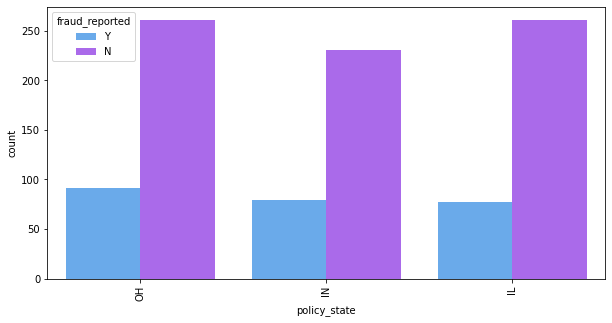

policy_csl :
250/500     351
100/300     349
500/1000    300
Name: policy_csl, dtype: int64


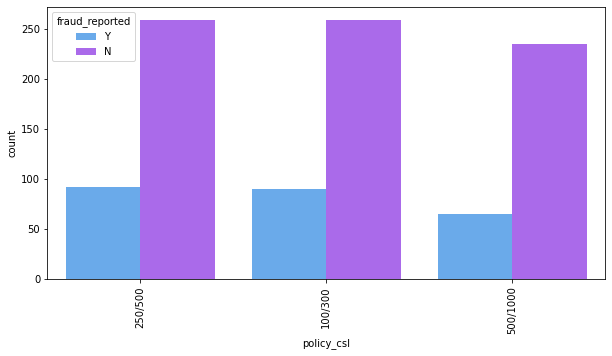

insured_sex :
FEMALE    537
MALE      463
Name: insured_sex, dtype: int64


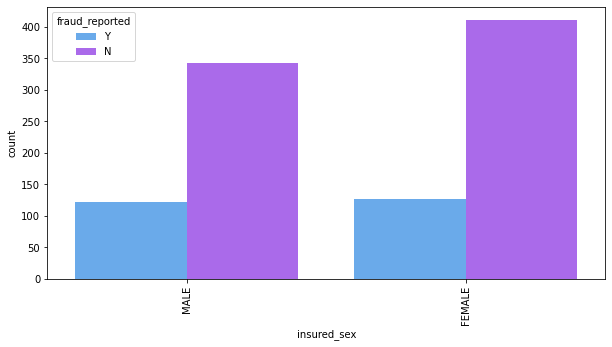

insured_education_level :
JD             161
High School    160
Associate      145
MD             144
Masters        143
PhD            125
College        122
Name: insured_education_level, dtype: int64


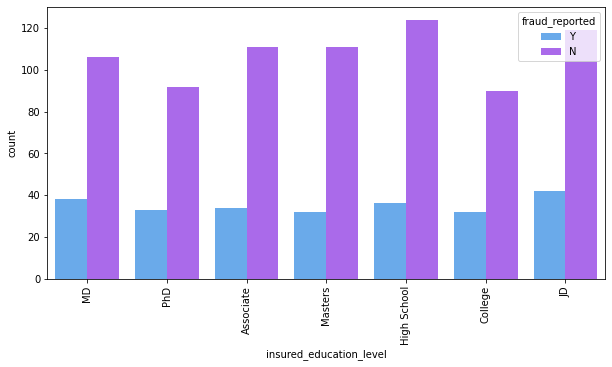

insured_occupation :
machine-op-inspct    93
prof-specialty       85
tech-support         78
sales                76
exec-managerial      76
craft-repair         74
transport-moving     72
other-service        71
priv-house-serv      71
armed-forces         69
adm-clerical         65
protective-serv      63
handlers-cleaners    54
farming-fishing      53
Name: insured_occupation, dtype: int64


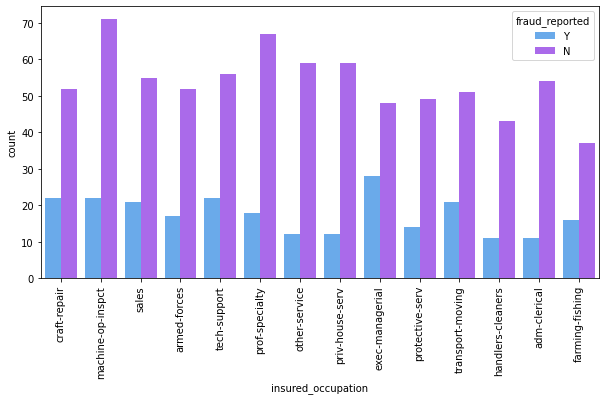

insured_hobbies :
reading           64
exercise          57
paintball         57
bungie-jumping    56
movies            55
golf              55
camping           55
kayaking          54
yachting          53
hiking            52
video-games       50
skydiving         49
base-jumping      49
board-games       48
polo              47
chess             46
dancing           43
sleeping          41
cross-fit         35
basketball        34
Name: insured_hobbies, dtype: int64


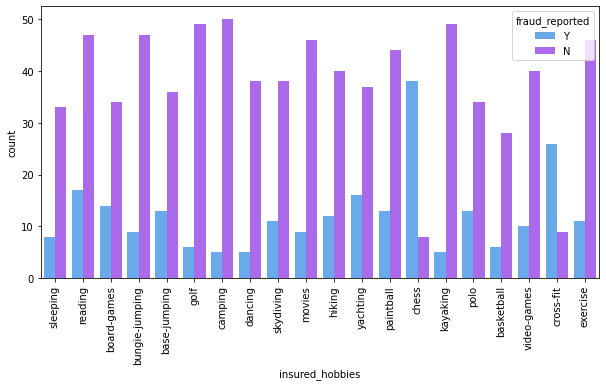

insured_relationship :
own-child         183
other-relative    177
not-in-family     174
husband           170
wife              155
unmarried         141
Name: insured_relationship, dtype: int64


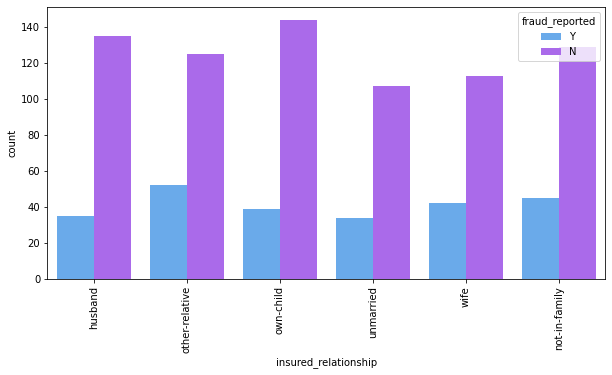

incident_type :
Multi-vehicle Collision     419
Single Vehicle Collision    403
Vehicle Theft                94
Parked Car                   84
Name: incident_type, dtype: int64


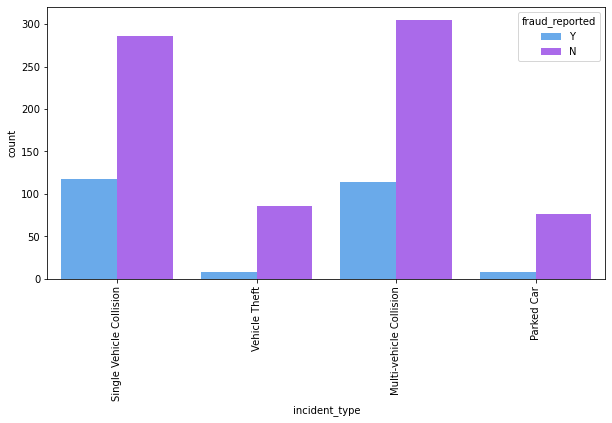

collision_type :
Rear Collision     376
Side Collision     276
Front Collision    254
Other Damages       94
Name: collision_type, dtype: int64


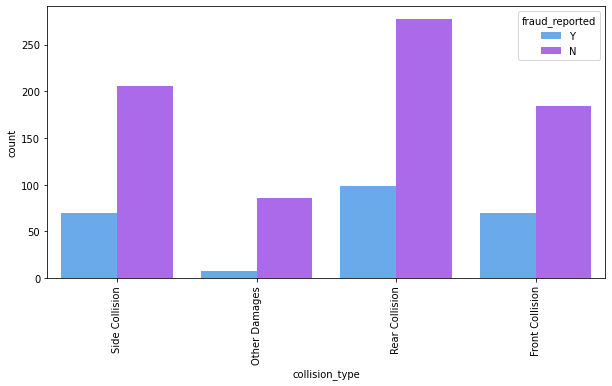

incident_severity :
Minor Damage      354
Total Loss        280
Major Damage      276
Trivial Damage     90
Name: incident_severity, dtype: int64


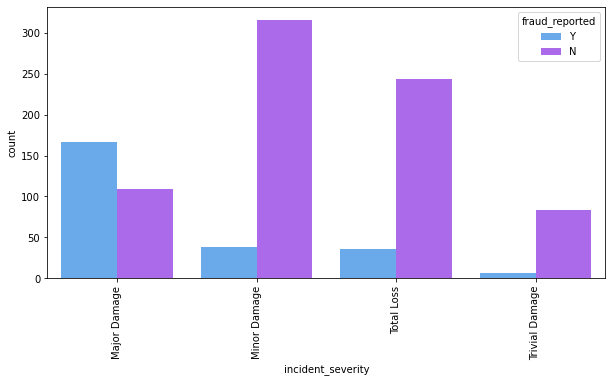

authorities_contacted :
Police       292
Fire         223
Other        198
Ambulance    196
None          91
Name: authorities_contacted, dtype: int64


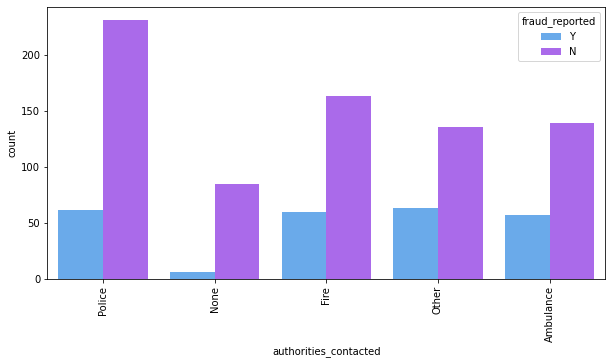

incident_state :
NY    262
SC    248
WV    217
VA    110
NC    110
PA     30
OH     23
Name: incident_state, dtype: int64


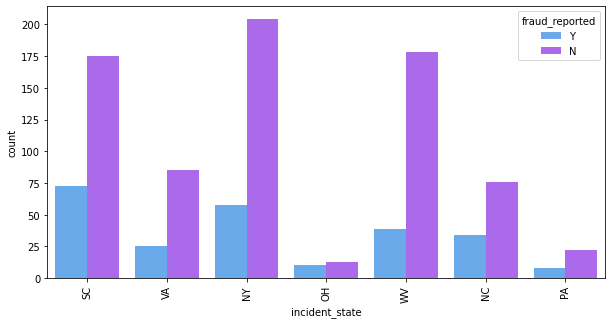

incident_city :
Springfield    157
Arlington      152
Columbus       149
Northbend      145
Hillsdale      141
Riverwood      134
Northbrook     122
Name: incident_city, dtype: int64


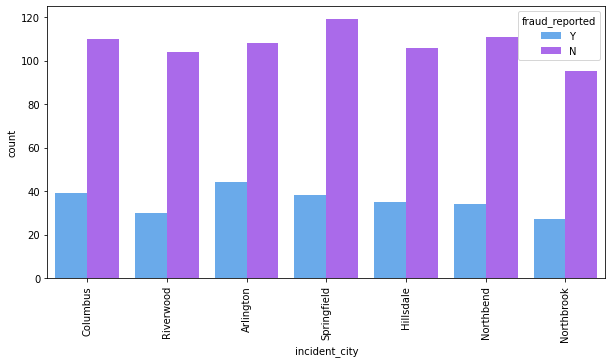

property_damage :
NO     698
YES    302
Name: property_damage, dtype: int64


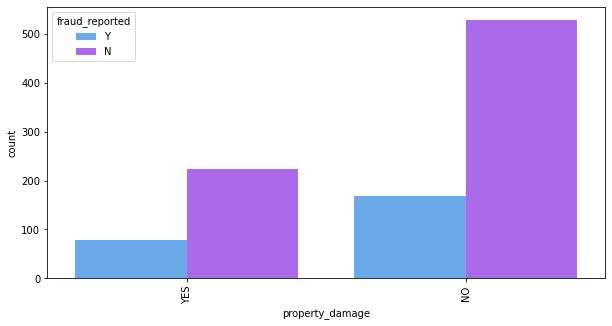

police_report_available :
NO     686
YES    314
Name: police_report_available, dtype: int64


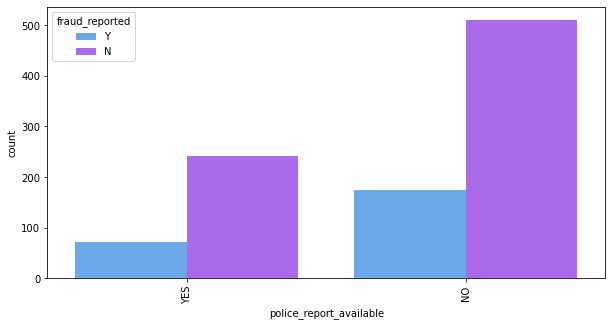

auto_make :
Saab          80
Dodge         80
Suburu        80
Nissan        78
Chevrolet     76
Ford          72
BMW           72
Toyota        70
Audi          69
Accura        68
Volkswagen    68
Jeep          67
Mercedes      65
Honda         55
Name: auto_make, dtype: int64


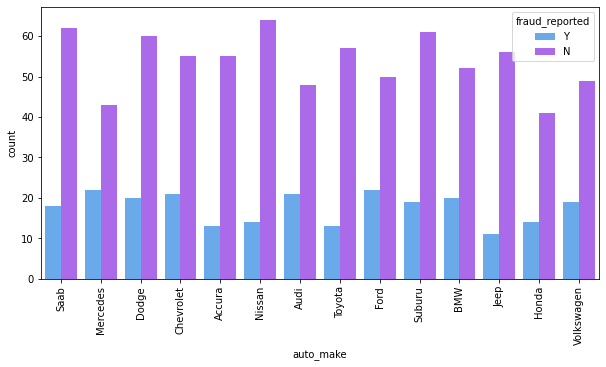

auto_model :
RAM               43
Wrangler          42
A3                37
Neon              37
MDX               36
Jetta             35
Passat            33
A5                32
Legacy            32
Pathfinder        31
Malibu            30
92x               28
Camry             28
Forrestor         28
F150              27
95                27
E400              27
93                25
Grand Cherokee    25
Escape            24
Tahoe             24
Maxima            24
Ultima            23
X5                23
Highlander        22
Civic             22
Silverado         22
Fusion            21
ML350             20
Impreza           20
Corolla           20
TL                20
CRV               20
C300              18
3 Series          18
X6                16
M5                15
Accord            13
RSX               12
Name: auto_model, dtype: int64


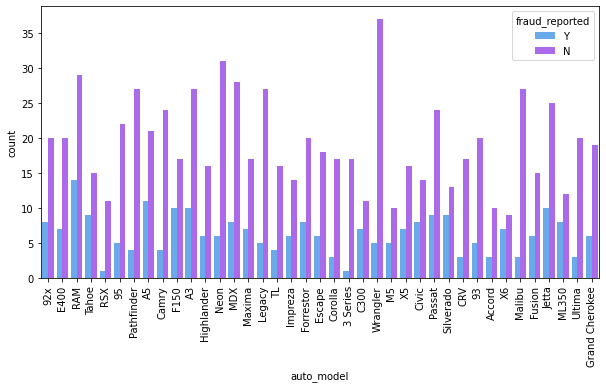

fraud_reported :
N    753
Y    247
Name: fraud_reported, dtype: int64


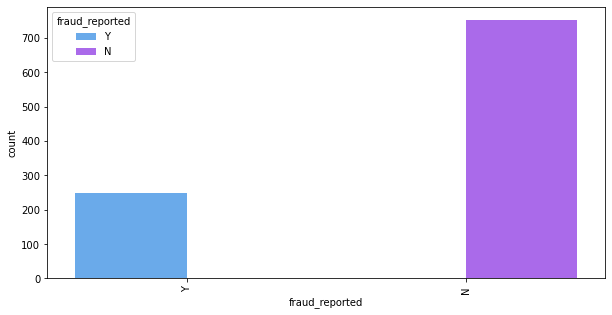

In [35]:
for column in obj_columns:
    print(column,':')
    print(df[column].value_counts())
    plt.figure(figsize=(10,5))
    sns.countplot(df[column],hue=df['fraud_reported'],palette='cool')
    plt.xticks(rotation=90)
    plt.show()

##### Observations:
    - IN policy holders have a lesser count of being involved in an Accident.
        - Policy holders from IL have the least count of insurance fraud.
        
    - The count of Females indulging in accidents is higher than the Male.
    
    - Policy customers with insured_education_level JD and High School indulge in the highest count of accidents and customers with College the least.
    
    - Policy customers with occupation as machine-op-inspct indulge in the highest accidents and farming-fishing  the least.
        - exec-managerial have the highest count for frauds.
        
    - Drivers with hobbies as reading has the highest count and basketball the least.
        - Drivers with hobbies cross-fit and chess tend to commit the highest frauds.
        
    - Drivers own-child tends to get involved the highest in the accidents.
    
    - incident_type Multi-vehicle Collision has the higest counts.
        - Single Vehicle Collision has the highest % of frauds and Vehicle Theft the least.
        
    - Rear Collision is the most common type of accident.
    
    - In incident_severity, we see Minor Damage having the higest count and Trivial Damage the least.
        - Customers with Minor Damage are the once wou endulge in % of frauds.
        
    - We see the highest count of accidents in New York and he least in Ohio.
        - The percentage of Fraud reported is the highest in Ohio.
        
    - Springfield tends to have the higest amount of accidents.
    
    - Majority of the accidents tend to have no property damage.
    
    - Nissan drivers have the highest accident count and Honda and Merc the least.
        - Merc drivers also have the highest % of fraud reported.
        
    - Jeep Wrngler has the Highest count of the accidents and BMW x6 the least.
         - X6 owners have the highest % of Fraud reported and 3 series owners the least.
        
    - We see the data is imbalance, 80% of the count consists of fraud not teported and 20% as reported which will have to be balanced.

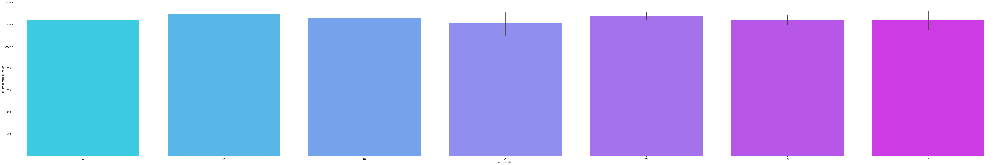

In [36]:
sns.catplot(y='policy_annual_premium',x = 'incident_state',data=df,kind='bar',height=10,aspect=6,palette='cool')
plt.show()

In [37]:
incident_state_total_claim = df.pivot_table(values='total_claim_amount',index='incident_state').sort_values(by='total_claim_amount')
incident_state_total_claim

,total_claim_amount
incident_state,
NC,49283.909091
PA,49571.666667
OH,49770.434783
VA,49997.909091
WV,50217.281106
SC,54589.314516
NY,56388.435115


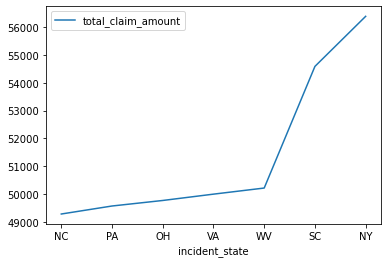

In [38]:
incident_state_total_claim.plot()
plt.show()

From above, we see NC have the least claim amount and NY Collision the highest.

In [39]:
incident_type_total_claim = df.pivot_table(values='total_claim_amount',index='incident_type').sort_values(by='total_claim_amount')
incident_type_total_claim

,total_claim_amount
incident_type,
Parked Car,5308.214286
Vehicle Theft,5517.234043
Multi-vehicle Collision,61637.016706
Single Vehicle Collision,64445.459057


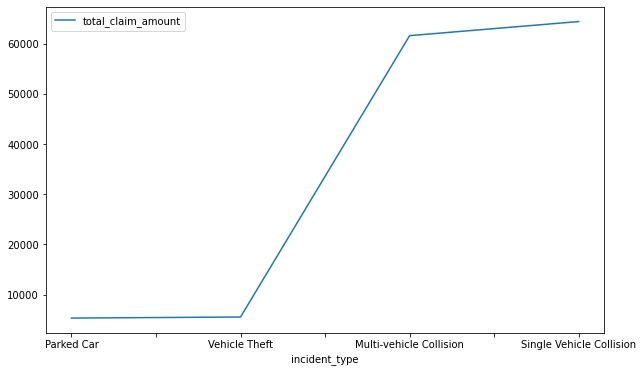

In [40]:
incident_type_total_claim.plot(figsize=(10,6))
plt.show()

From above, we see parked car's have the least claim amount and Single Vehicle Collision the highest.

In [41]:
auto_make_total_claim = df.pivot_table(values='total_claim_amount',index='auto_make').sort_values(by='total_claim_amount')
auto_make_total_claim

,total_claim_amount
auto_make,
Toyota,46523.714286
Volkswagen,50854.852941
Saab,51445.375000
Nissan,51545.256410
Jeep,51608.805970
Honda,51714.909091
Mercedes,52372.153846
Accura,52518.823529
Chevrolet,52746.578947


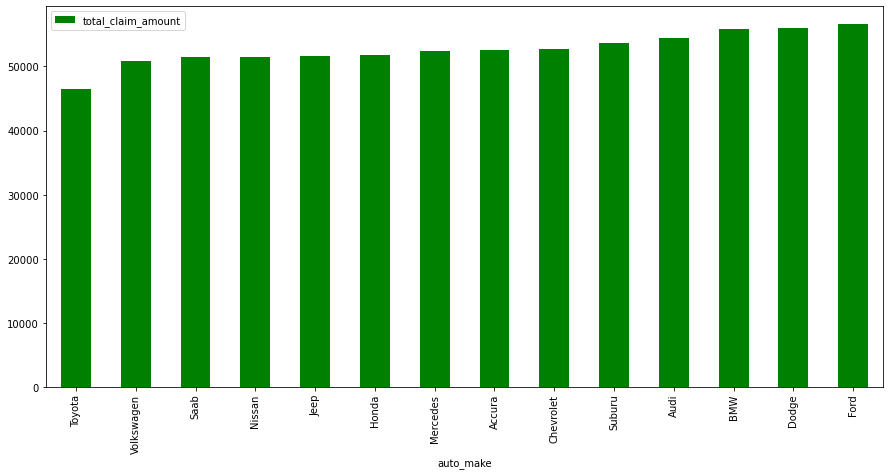

In [42]:
auto_make_total_claim.plot(kind='bar',figsize=(15,7),color='g')
plt.show()

From above we see that the claims made by Toyota drivers are the least and Ford are the highest

In [43]:
list_cat = ['age','policy_deductable','umbrella_limit','incident_hour_of_the_day','number_of_vehicles_involved','bodily_injuries','witnesses','auto_year','policy_bind_month','policy_bind_year','incident_month','incident_year']

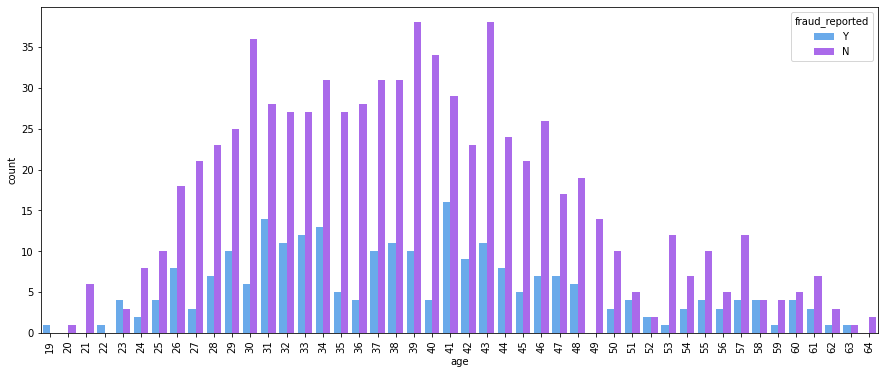

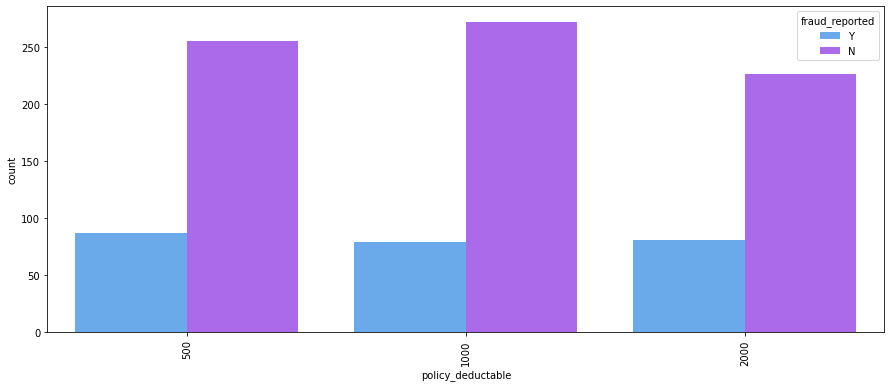

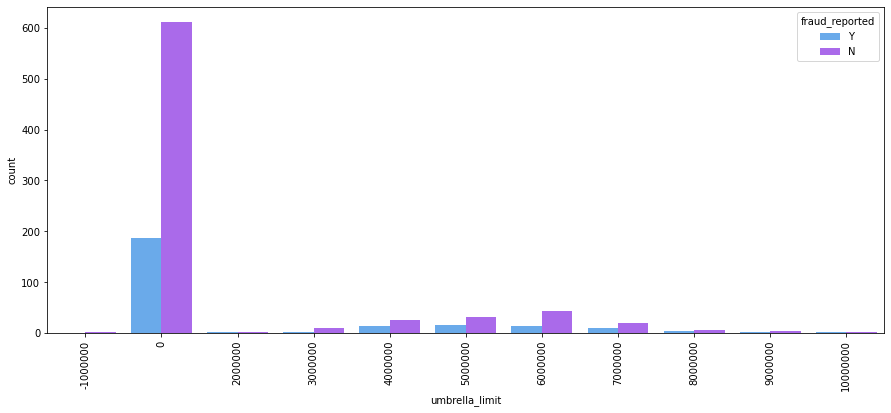

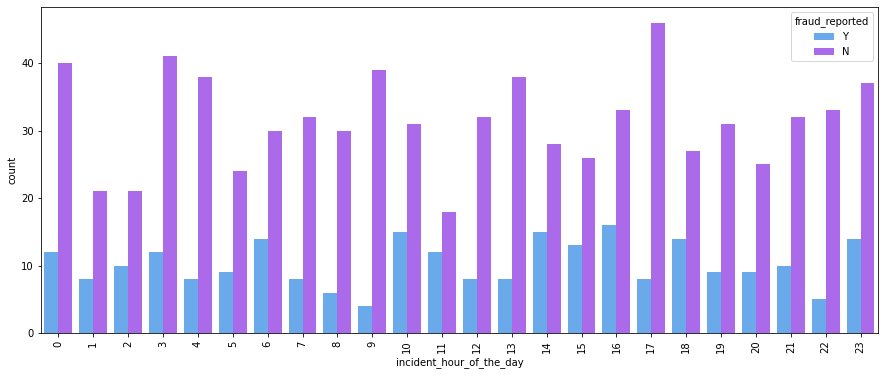

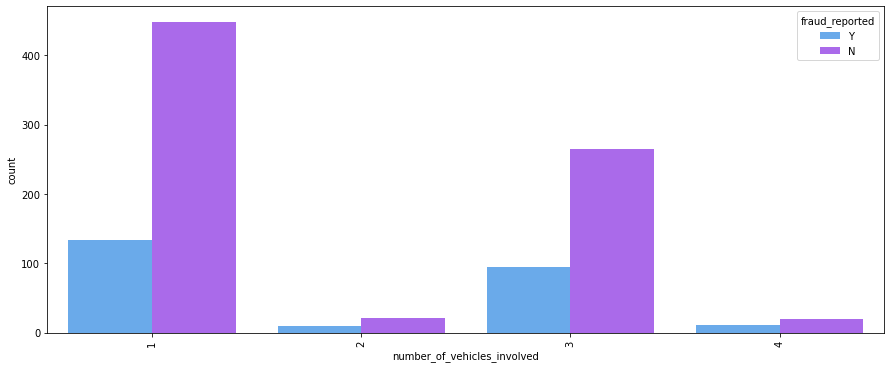

...

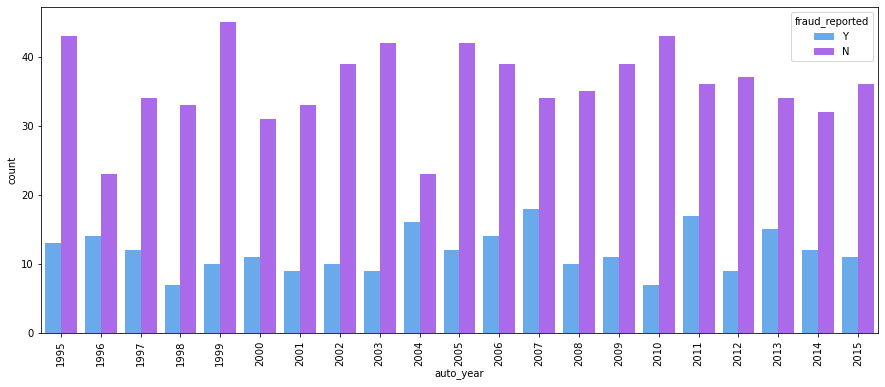

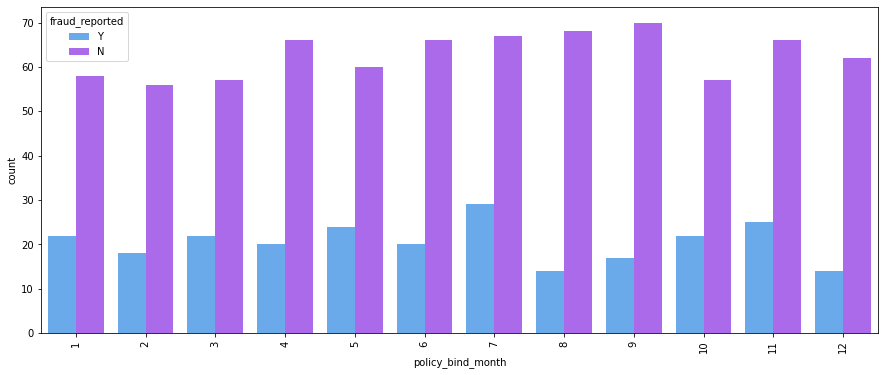

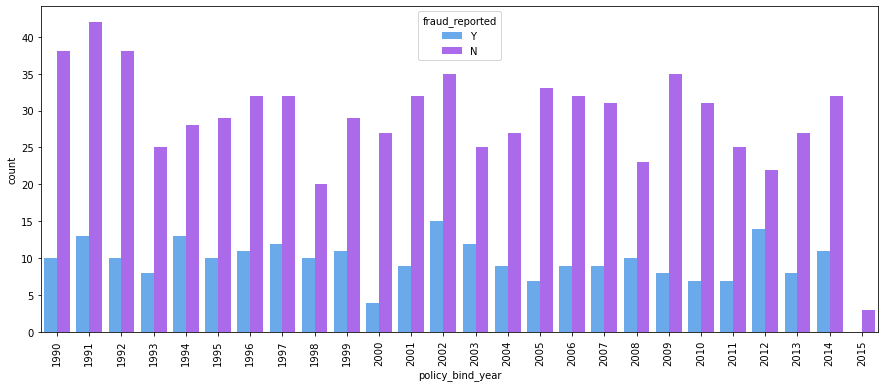

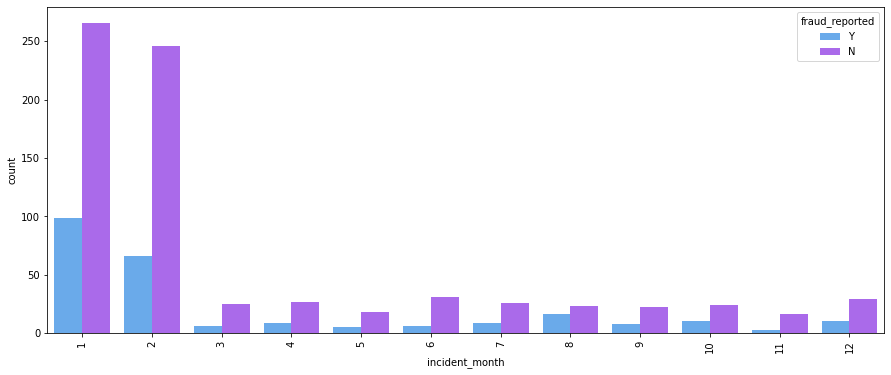

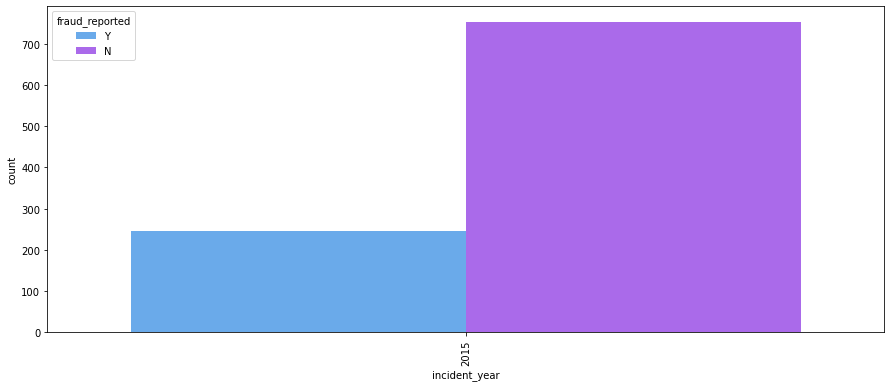

In [44]:
for column in list_cat:
    plt.figure(figsize=(15,6))
    sns.countplot(df[column],hue=df['fraud_reported'],palette='cool')
    plt.xticks(rotation=90)
    plt.show()

- Majority of the customers are in the age group 26-48
- Umbrela count 0 has the highest count.
- The highest number of accients are with 1 vehicle involved.
- We significantly high number of accients in 1st and 2nd month.
- We see incident_year has just 1 value 2015,we could drop it as it'd not affect out output.

In [45]:
df.drop('incident_year',axis=1,inplace=True)

In [46]:
list_cont = ['months_as_customer', 'policy_annual_premium', 'insured_zip', 'capital-gains','capital-loss','total_claim_amount','injury_claim','property_claim','vehicle_claim']

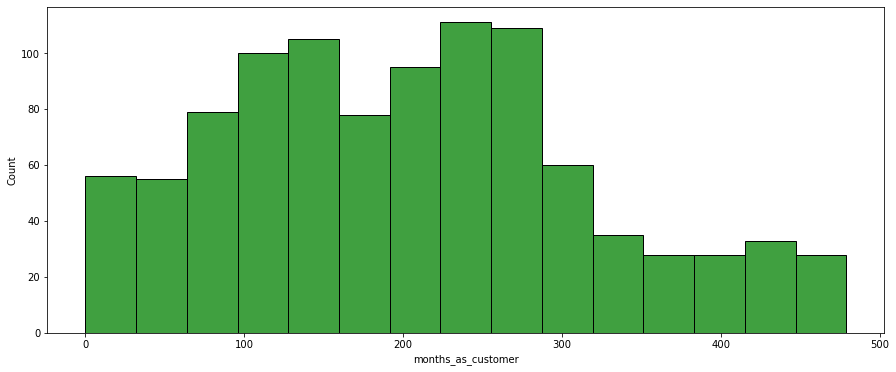

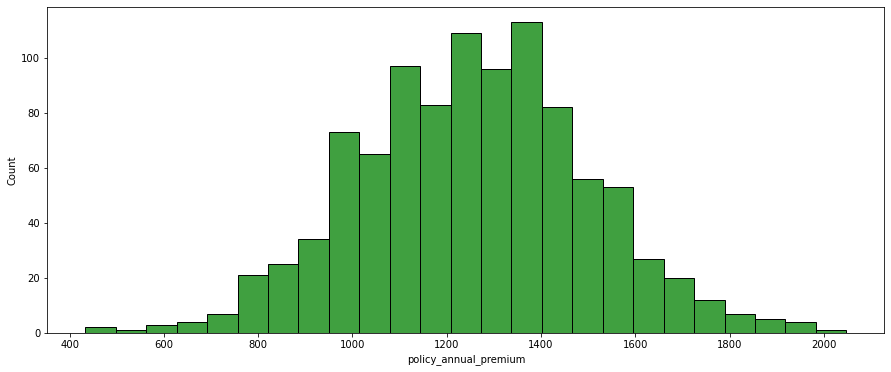

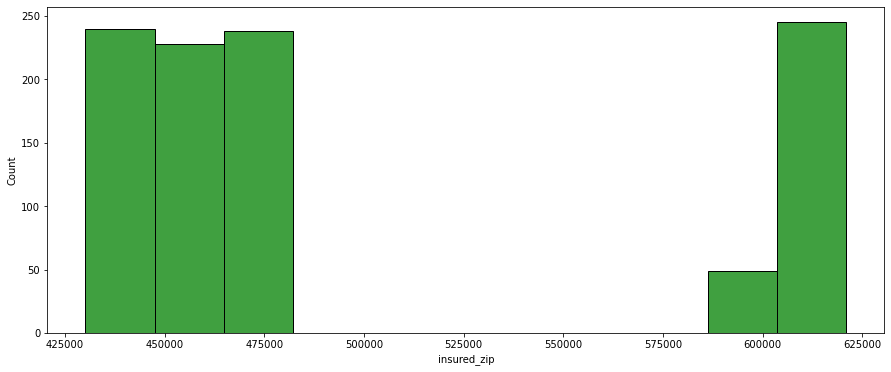

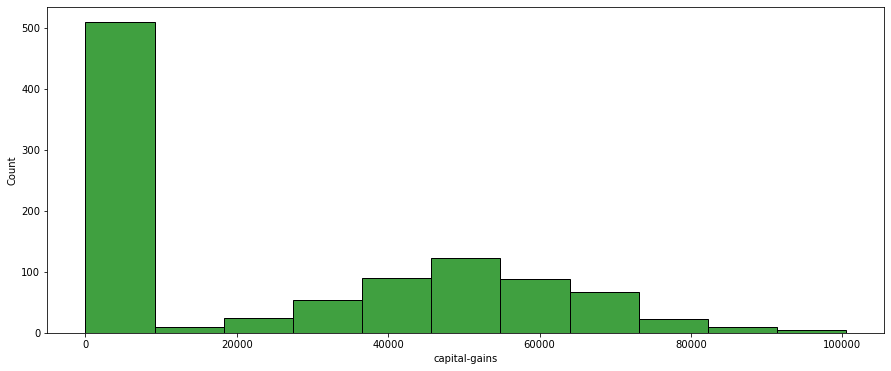

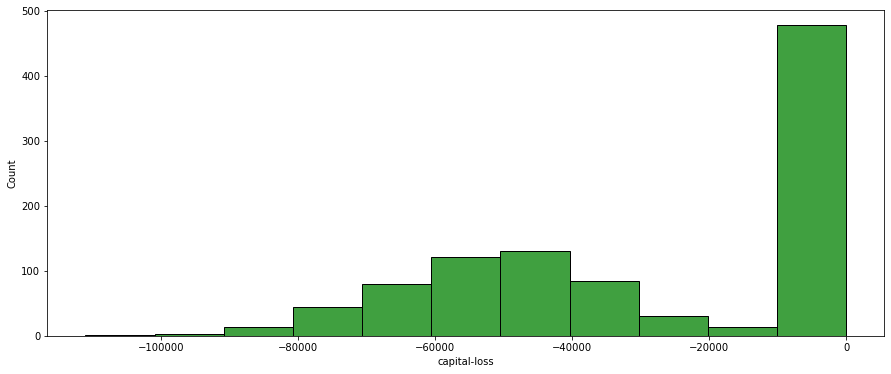

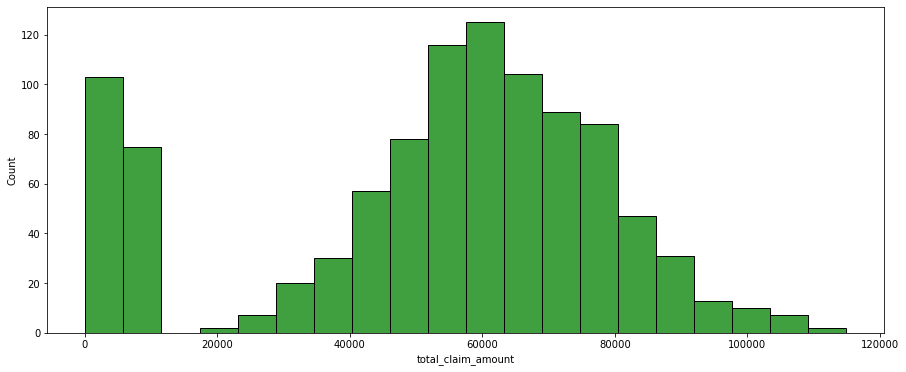

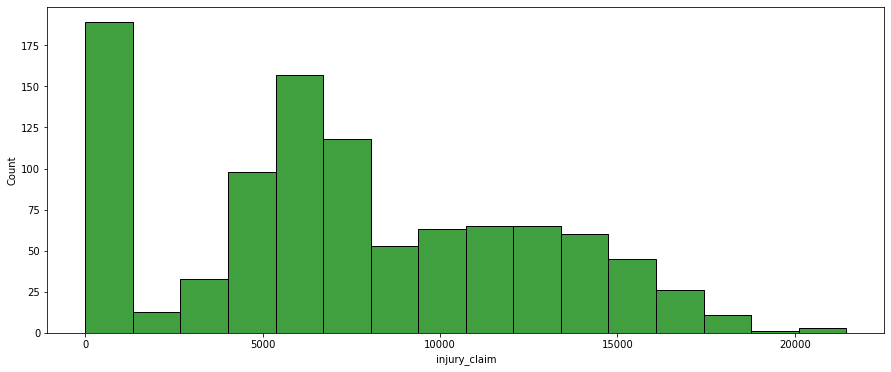

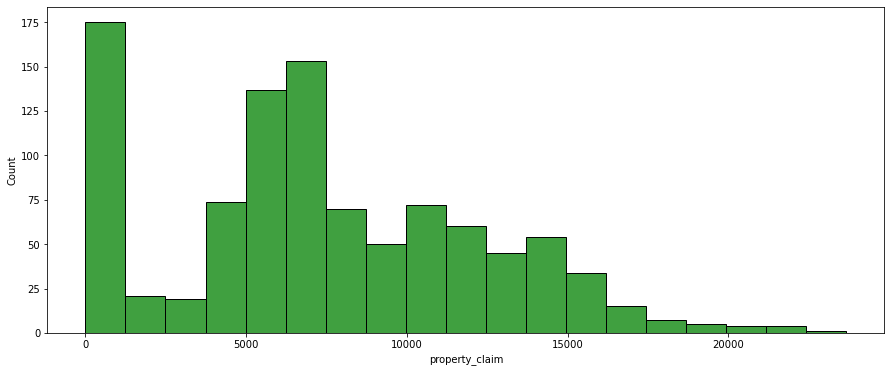

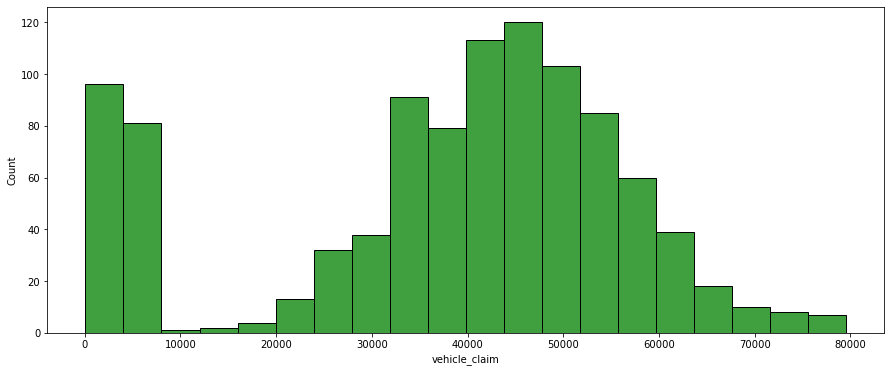

In [47]:
for i in list_cont:
    plt.figure(figsize=(15,6))
    sns.histplot(df[i],color='g')
    plt.show()

- Majority of the customers are in the range 100-275 months.
- Majority of the customers pay a premium between 975-1450.
- Majority of the claims are between 50-80k.
- We have a large chunk of people who do not make claims.
- We could delete zip as it would not affect the model.

In [48]:
df.drop('insured_zip',axis=1,inplace=True)

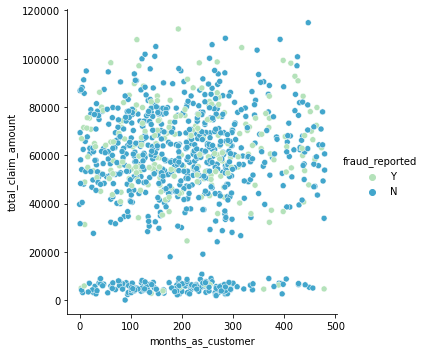

In [49]:
sns.relplot(x='months_as_customer',y='total_claim_amount',data=df,hue='fraud_reported',palette='GnBu')
plt.show()

We see a large number of Non-Fraudulant customers making no claims.

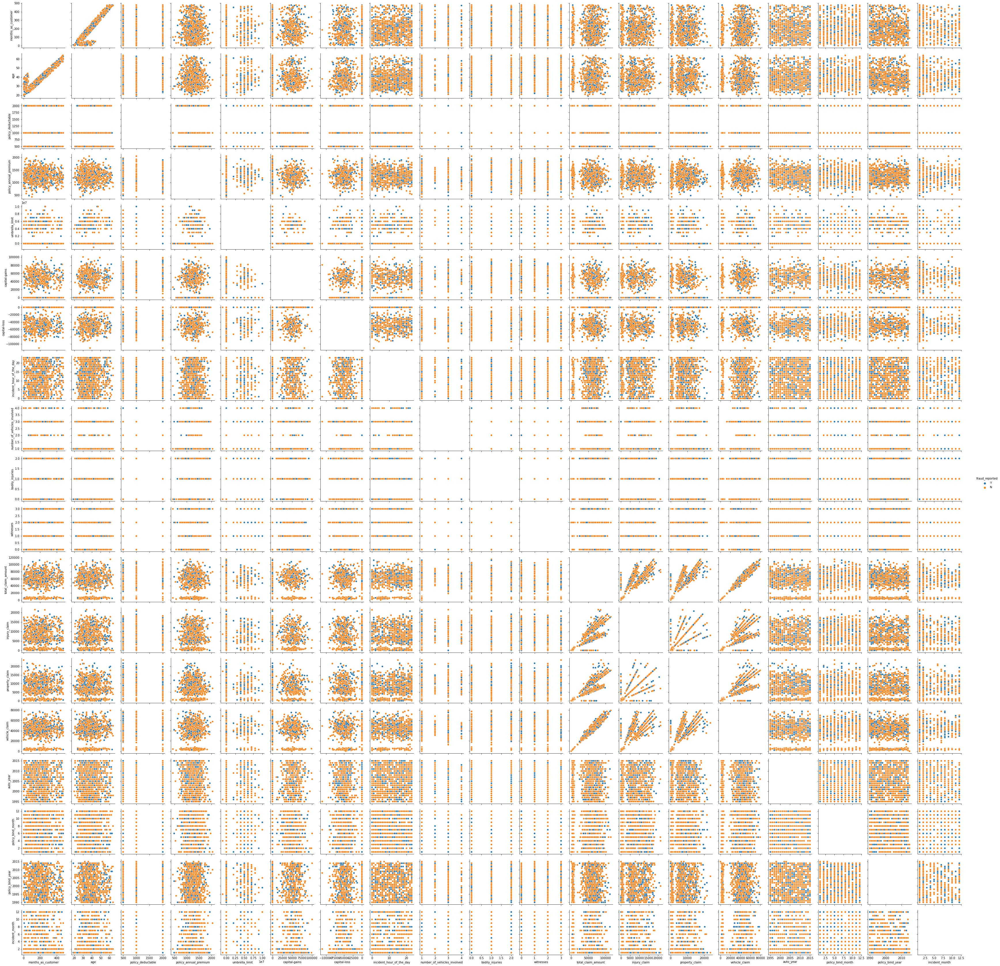

In [50]:
sns.pairplot(df,diag_kind='density',hue='fraud_reported')
plt.show()

### Checking Skewness

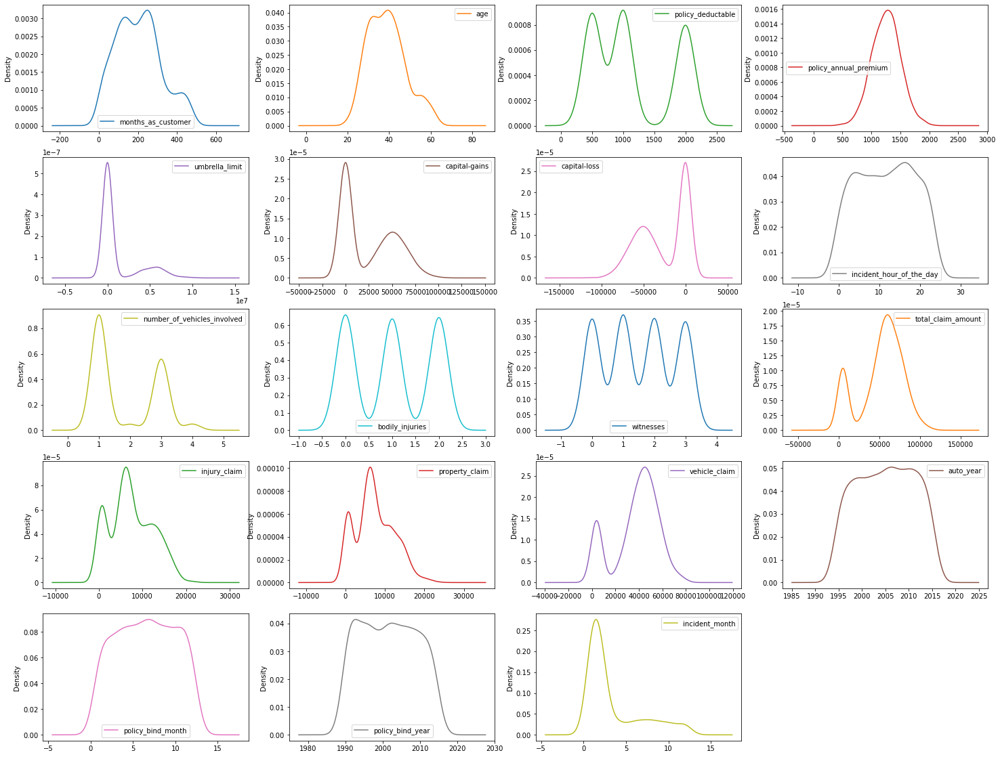

In [51]:
df.plot(kind='density',subplots=True,layout=(5,4),figsize=(25,20),sharex=False)
plt.show()

In [52]:
df.skew().sort_values(ascending=False)

umbrella_limit                 1.806712
incident_month                 1.375894
number_of_vehicles_involved    0.502664
age                            0.478988
capital-gains                  0.478850
policy_deductable              0.477887
property_claim                 0.378169
months_as_customer             0.362177
injury_claim                   0.264811
policy_bind_year               0.052511
witnesses                      0.019636
bodily_injuries                0.014777
policy_annual_premium          0.004402
policy_bind_month             -0.029321
incident_hour_of_the_day      -0.035584
auto_year                     -0.048289
capital-loss                  -0.391472
total_claim_amount            -0.594582
vehicle_claim                 -0.621098
dtype: float64

Setting the Skewness threshold as +/-0.75, we see skewness in

    - umbrella_limit                 1.806712
    - incident_month                 1.375894
off which incident_month is categorical and can be ignored.

### Checking Outliers

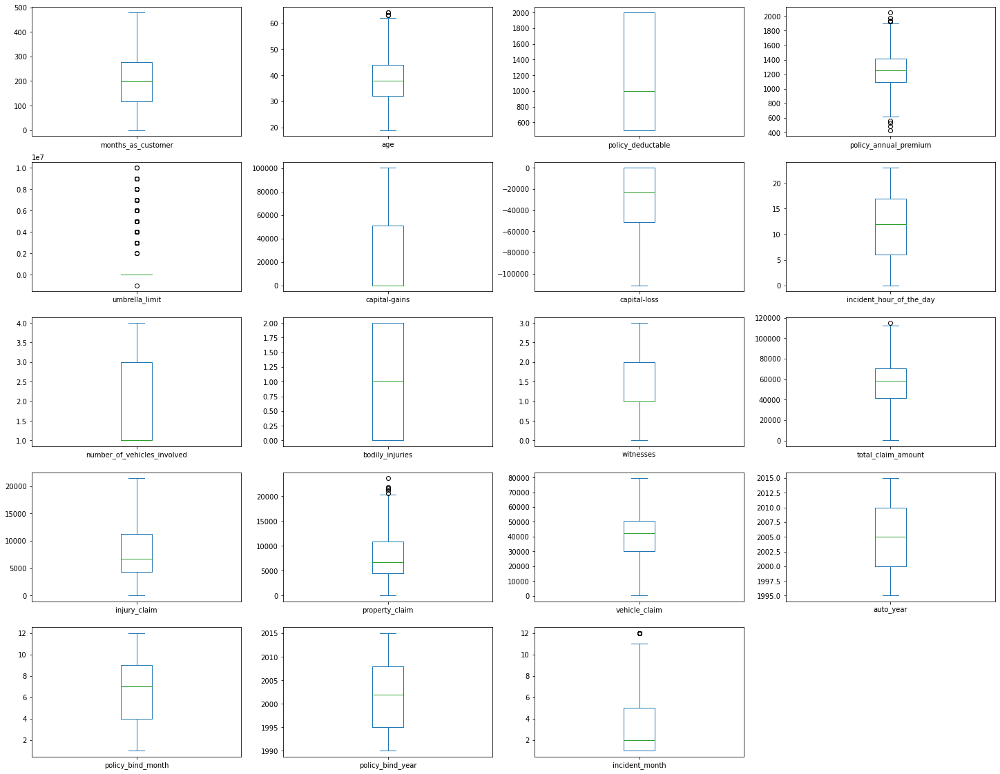

In [53]:
df.plot(kind='box',subplots=True,figsize=(25,20),layout=(5,4),sharex=True)
plt.show()

We see Huge amount of outliersin umbrella_limit, a few outliers in age,policy_annual_premium,total_claim_amount,property_claim and incident_month, but again incident_month is categorical.

### Encoding Object type columns

In [54]:
from sklearn.preprocessing import LabelEncoder
le = LabelEncoder()

In [55]:
for i in obj_columns:
    df[i] = le.fit_transform(df[i])
df

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,policy_bind_month,policy_bind_year,incident_month
0,328,48,2,1,1000,1406.91,0,1,4,2,17,0,53300,0,2,3,0,4,4,1,5,1,1,1,2,1,71610,6510,13020,52080,10,1,2004,1,10,2014,1
1,228,42,1,1,2000,1197.22,5000000,1,4,6,15,2,0,0,3,1,1,4,5,5,8,1,0,0,0,0,5070,780,780,3510,8,12,2007,1,6,2006,1
2,134,29,2,0,2000,1413.14,5000000,0,6,11,2,3,35100,0,0,2,1,4,1,1,7,3,0,2,3,0,34650,7700,3850,23100,4,30,2007,0,6,2000,2
3,256,41,0,1,2000,1415.74,6000000,0,6,1,2,4,48900,-62400,2,0,0,4,2,0,5,1,0,1,2,0,63400,6340,6340,50720,3,34,2014,1,5,1990,10
4,228,44,0,2,1000,1583.91,6000000,1,0,11,2,4,66000,-46000,3,1,1,2,1,0,20,1,0,0,1,0,6500,1300,650,4550,0,31,2009,0,6,2014,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,2,2,1000,1310.80,0,0,5,2,13,4,0,0,2,0,1,1,0,4,20,1,1,0,1,0,87200,17440,8720,61040,6,6,2006,0,7,1991,2
996,285,41,0,0,1000,1436.79,0,0,6,9,17,5,70900,0,2,2,0,1,4,3,23,1,1,2,3,0,108480,18080,18080,72320,13,28,2015,0,5,2014,1
997,130,34,2,1,500,1383.49,3000000,0,5,1,3,2,35100,0,0,3,1,4,0,0,4,3,0,2,3,1,67500,7500,7500,52500,11,19,1996,0,2,2003,1
998,458,62,0,2,2000,1356.92,5000000,1,0,5,0,5,0,0,2,2,0,3,1,0,2,1,0,0,1,1,46980,5220,5220,36540,1,5,1998,0,11,2011,2


### Finding Correlation

In [56]:
df.corr()

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,policy_bind_month,policy_bind_year,incident_month
months_as_customer,1.000000,0.922098,-0.000328,-0.026819,0.026807,0.005018,0.015498,0.060925,-0.000833,0.009814,-0.093661,0.069727,0.006399,0.020209,-0.017377,-0.073442,-0.059581,0.010021,0.005369,-0.000130,0.070639,0.014736,0.005488,-0.010162,0.058383,-0.022146,0.062108,0.065329,0.034940,0.061013,0.047655,0.004202,-0.000292,0.020544,0.005750,-0.048276,0.024659
age,0.922098,1.000000,-0.014533,-0.015185,0.029188,0.014404,0.018126,0.073337,0.000969,0.017220,-0.081315,0.074832,-0.007075,0.007368,-0.025626,-0.076340,-0.058439,0.015417,0.005770,-0.002291,0.087161,0.022102,-0.003408,-0.015679,0.052359,-0.020441,0.069863,0.075522,0.060898,0.062588,0.030410,0.017343,0.001354,0.012143,0.015501,-0.037444,0.023404
policy_state,-0.000328,-0.014533,1.000000,0.001027,0.010033,0.012455,-0.029580,-0.020481,-0.034327,-0.031215,-0.038689,-0.018506,0.074551,-0.030338,0.031848,0.060203,-0.026377,-0.016777,0.008723,-0.002077,0.029457,-0.042263,-0.008465,0.013384,0.022960,0.069017,-0.006002,-0.046290,0.008406,0.001425,0.017124,-0.025253,0.002114,0.029432,0.071450,-0.007276,0.023643
policy_csl,-0.026819,-0.015185,0.001027,1.000000,0.003384,0.023978,0.021636,-0.010757,0.009153,0.015788,-0.005960,-0.030063,0.005249,-0.034612,0.011997,0.008823,0.022530,0.056182,0.032814,0.009333,-0.001869,-0.019403,-0.027634,-0.000595,0.071500,-0.001645,-0.055758,-0.078818,-0.042216,-0.046791,-0.004701,0.047885,-0.033082,-0.037190,-0.045345,-0.016466,-0.011794
policy_deductable,0.026807,0.029188,0.010033,0.003384,1.000000,-0.003245,0.010870,-0.009733,0.015217,-0.046733,0.004061,-0.022945,0.035212,-0.023544,-0.038411,-0.061669,-0.015711,-0.000760,0.006517,-0.045117,0.060935,0.051214,0.015770,-0.022765,0.066639,0.038036,0.022839,0.039107,0.064792,0.005269,-0.035379,-0.003268,0.026105,0.014817,-0.050416,-0.049598,-0.006418
policy_annual_premium,0.005018,0.014404,0.012455,0.023978,-0.003245,1.000000,-0.006247,0.038853,-0.019715,0.035922,-0.018019,0.001925,-0.013738,0.023547,0.053603,0.030563,-0.011155,-0.055191,0.046434,0.048724,-0.001578,-0.045991,0.080738,0.026780,0.002332,0.021998,0.009094,-0.017633,-0.011654,0.020246,0.000045,-0.031849,-0.049226,-0.014480,-0.035355,0.001249,0.021559
umbrella_limit,0.015498,0.018126,-0.029580,0.021636,0.010870,-0.006247,1.000000,0.010688,-0.019357,0.023422,-0.037000,0.077495,-0.047268,-0.024056,0.015966,0.003821,0.009466,0.029044,-0.077492,0.013094,-0.023257,-0.021270,-0.076358,0.022743,-0.006738,-0.044771,-0.040344,-0.045412,-0.023790,-0.038584,-0.004443,0.040256,0.009893,0.058622,0.009961,0.048008,0.042409
insured_sex,0.060925,0.073337,-0.020481,-0.010757,-0.009733,0.038853,0.010688,1.000000,0.009002,-0.006160,-0.020317,0.002855,-0.020494,-0.021705,0.009952,-0.026702,-0.028168,0.017914,-0.022379,0.014470,0.019290,0.018793,0.026969,-0.020297,0.042463,0.006992,-0.023727,0.000924,-0.014868,-0.029609,0.026457,-0.018421,-0.028247,0.030873,-0.004033,-0.032891,0.024227
insured_education_level,-0.000833,0.000969,-0.034327,0.009153,0.015217,-0.019715,-0.019357,0.009002,1.000000,-0.020298,0.021807,-0.023488,0.039912,0.041193,0.013704,-0.021371,-0.006420,-0.010838,-0.005903,-0.018636,-0.057061,-0.003768,-0.048909,-0.012072,0.019211,0.051640,0.074226,0.081880,0.055794,0.068348,0.055202,0.049445,0.043509,0.008808,-0.007118,0.018952,0.075083
insured_occupation,0.009814,0.017220,-0.031215,0.015788,-0.046733,0.035922,0.023422,-0.006160,-0.020298,1.000000,-0.011077,-

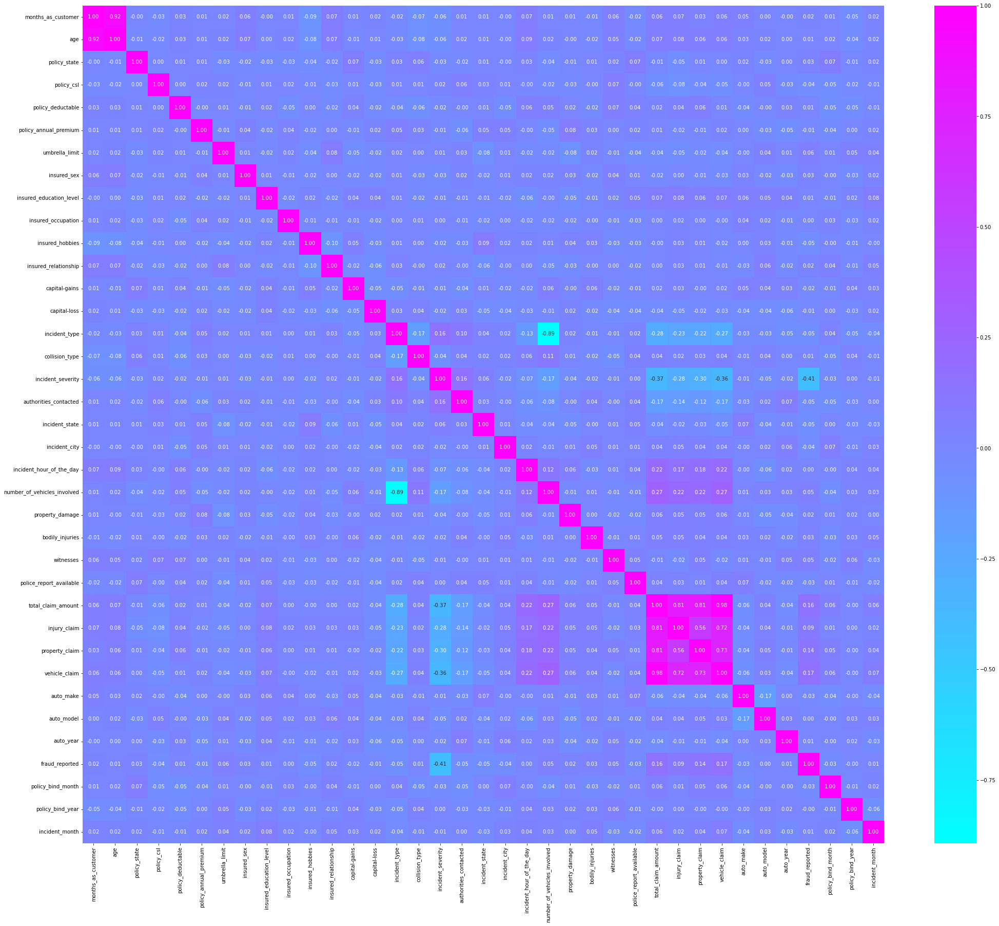

In [57]:
plt.figure(figsize=(35,30))
sns.heatmap(df.corr(),annot=True,fmt='.2f',cmap='cool')
plt.show()

- We see that the features have both positive and negitive relationship with the target varriable.
- inciddent severity has the highest negitive correlation with the target varriable.
- We see a very high correlation between the claims.

### Removing outliers

In [58]:
from scipy.stats import zscore

In [59]:
[(np.abs(zscore(df))<3).all()]

[months_as_customer              True
 age                             True
 policy_state                    True
 policy_csl                      True
 policy_deductable               True
 policy_annual_premium          False
 umbrella_limit                 False
 insured_sex                     True
 insured_education_level         True
 insured_occupation              True
 insured_hobbies                 True
 insured_relationship            True
 capital-gains                   True
 capital-loss                   False
 incident_type                   True
 collision_type                  True
 incident_severity               True
 authorities_contacted           True
 incident_state                  True
 incident_city                   True
 incident_hour_of_the_day        True
 number_of_vehicles_involved     True
 property_damage                 True
 bodily_injuries                 True
 witnesses                       True
 police_report_available         True
 total_claim

We see outliers in 'property_claim','capital-loss','umbrella_limit','policy_annual_premium'

### Removing Outliers

In [60]:
z = np.abs(zscore(df))
z.shape

(1000, 37)

In [61]:
df = df[(z<3).all(axis=1)]
df.shape

(980, 37)

### Percentage Data loss

In [62]:
percentage_loss = (1000-980)/1000*100
percentage_loss

2.0

### Splitting the data in x and y

In [63]:
x = df.drop('fraud_reported',axis=1)
x.shape

(980, 36)

In [64]:
y = df['fraud_reported']
y.shape

(980,)

### Normalizing the data using Power_Transform

In [65]:
from sklearn.preprocessing import power_transform

In [66]:
X = power_transform(x)
X = pd.DataFrame(X,columns=x.columns)
X

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,policy_bind_month,policy_bind_year,incident_month
0,1.044541,1.002330,1.141477,0.189051,0.063154,0.623999,-0.337086,1.071971,0.571955,-1.152452,1.221846,-1.565143,1.028989,1.048516,0.819662,1.203944,-1.369547,1.156859,0.401673,-0.942160,-0.916935,-0.839387,1.512809,0.094895,0.523536,1.473608,0.720163,0.008582,1.089802,0.758130,0.854812,-1.807212,-0.204435,1.001851,2.425837e-14,-1.100637
1,0.299045,0.427171,0.059002,0.189051,1.271808,-0.241075,1.482455,1.071971,0.571955,-0.086335,0.915742,-0.148870,-0.986627,1.048516,1.442602,-0.634709,-0.067080,1.156859,0.821087,0.977876,-0.447636,-0.839387,-0.661022,-1.264943,-1.406436,-0.678606,-1.778146,-1.522095,-1.563723,-1.787485,0.411873,-0.578486,0.295877,-0.104864,8.770762e-15,-1.100637
2,-0.515819,-1.136013,1.141477,-1.231867,1.271808,0.649541,1.482455,-0.932861,1.459110,1.056805,-1.400361,0.419239,0.955106,1.048516,-1.130123,0.258871,-0.067080,1.156859,-1.018622,-0.942160,-0.599018,1.194880,-0.661022,1.177809,1.292411,-0.678606,-0.715924,0.226178,-0.582075,-0.820246,-0.564584,0.950426,0.295877,-0.104864,-3.053113e-15,-0.021968
3,0.517526,0.324015,-1.265764,0.189051,1.271808,0.660199,1.788485,-0.932861,1.459110,-1.463499,-1.400361,0.938269,1.013773,-1.006291,0.819662,-1.454599,-1.369547,1.156859,-0.508305,-1.604249,-0.916935,-0.839387,-0.661022,0.094895,0.523536,-0.678606,0.395030,-0.023878,-0.036218,0.681832,-0.837525,1.257076,1.495423,-0.402016,-2.309264e-14,1.557258
4,0.299045,0.626869,-1.265764,1.233389,0.063154,1.346451,1.788485,1.071971,-1.626734,1.056805,-1.400361,0.938269,1.066686,-0.941672,1.442602,-0.634709,-0.067080,-0.032665,-1.018622,-1.604249,1.144669,-0.839387,-0.661022,-1.264943,-0.348068,-0.678606,-1.730904,-1.300517,-1.628274,-1.740862,-1.813795,1.027909,0.633974,-0.104864,2.425837e-14,-0.021968
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
975,-2.293459,0.000032,1.141477,1.233389,0.063154,0.228826,-0.337086,-0.932861,1.025491,-1.152452,0.601150,0.938269,-0.986627,1.048516,0.819662,-1.454599,-0.067080,-0.705932,-1.599711,0.555823,1.144669,-0.839387,1.512809,-1.264943,-0.348068,-0.678606,1.344950,1.636206,0.405145,1.265008,-0.057831,-1.188128,0.128200,0.182827,-2.103873e-14,-0.021968
976,0.735268,0.324015,-1.265764,-1.231867,0.063154,0.746426,-0.337086,-0.932861,1.459110,0.616133,1.221846,1.421265,1.079302,1.048516,0.819662,0.258871,-1.369547,-0.705932,0.401673,0.103803,1.501769,-0.839387,1.512809,1.177809,1.292411,-0.678606,2.210977,1.714545,1.782279,1.912437,1.481706,0.793687,1.670528,-0.402016,2.425837e-14,-1.100637
977,-0.554272,-0.470598,1.141477,0.189051,-1.215211,0.527900,0.839984,-0.932861,1.025491,-1.463499,-1.184129,-0.148870,0.955106,1.048516,-1.130123,1.203944,-0.067080,1.156859,-1.599711,-1.604249,-1.085544,1.194880,-0.661022,1.177809,1.292411,1.473608,0.557034,0.190694,0.186254,0.781728,1.068236,0.053205,-1.499360,-1.375498,2.886580e-15,-1.100637
978,1.904088,2.121075,-1.265764,1.233389,1.271808,0.418724,1.482455,1.071971,-1.626734,-0.335204,-1.894503,1.421265,-0.986627,1.048516,0.819662,0.258871,-1.369547,0.582149,-1.018622,-1.604249,-1.451402,-0.839387,-0.661022,-1.264943,-0.348068,1.473608,-0.245515,-0.248074,-0.267909,-0.102017,-1.447930,-1.299968,-1.180901,1.263059,1.848521e-14,-0.021968


### Checking VIF

In [67]:
from statsmodels.stats.outliers_influence import variance_inflation_factor

In [68]:
def calculate_vif(dataset):
    vif = pd.DataFrame()
    vif['Features'] = dataset.columns
    vif['VIF_Values'] = [variance_inflation_factor(dataset.values,i)for i in range(dataset.shape[1])]
    return vif.sort_values(by='VIF_Values',ascending=False)

In [69]:
calculate_vif(X)

,Features,VIF_Values
26,total_claim_amount,237.170567
29,vehicle_claim,120.504182
28,property_claim,10.964608
27,injury_claim,10.755527
21,number_of_vehicles_involved,10.617924
14,incident_type,10.601039
1,age,4.734368
0,months_as_customer,4.721379
16,incident_severity,1.186727
17,authorities_contacted,1.103816


- lets keep the vif threshold as 5.
- We see a very high vif for total charges as it is the sum of vehicle + property+injury claims, hence we could drop vehicle,property and injury claims

In [70]:
X.drop(['vehicle_claim','property_claim','injury_claim'],axis =1,inplace=True)

In [71]:
calculate_vif(X)

,Features,VIF_Values
14,incident_type,10.586092
21,number_of_vehicles_involved,10.536475
1,age,4.692623
0,months_as_customer,4.682063
26,total_claim_amount,1.301700
16,incident_severity,1.165782
20,incident_hour_of_the_day,1.091600
15,collision_type,1.090541
17,authorities_contacted,1.079999
27,auto_make,1.066856


In [72]:
X.drop('number_of_vehicles_involved',axis=1,inplace=True)

In [73]:
calculate_vif(X)

,Features,VIF_Values
1,age,4.692427
0,months_as_customer,4.682057
25,total_claim_amount,1.291598
16,incident_severity,1.163648
14,incident_type,1.136272
20,incident_hour_of_the_day,1.091460
17,authorities_contacted,1.079436
15,collision_type,1.070356
26,auto_make,1.064354
27,auto_model,1.060489


### Balancing the Dataset

In [74]:
from imblearn.over_sampling import SMOTE
sm = SMOTE()

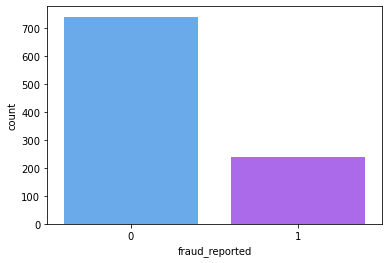

In [75]:
sns.countplot(y,palette='cool')
plt.show()

In [76]:
X,y = sm.fit_resample(X,y)
X.shape,y.shape

((1480, 32), (1480,))

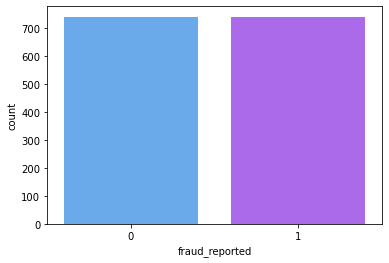

In [77]:
sns.countplot(y,palette='cool')
plt.show()

We see that the data is now balanced

### Scalling the Model

In [78]:
from sklearn.preprocessing import StandardScaler
sc = StandardScaler()

In [79]:
x = sc.fit_transform(X)
x = pd.DataFrame(x,columns=X.columns)
x

,months_as_customer,age,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_hour_of_the_day,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,auto_make,auto_model,auto_year,policy_bind_month,policy_bind_year,incident_month
0,1.060959,1.011403,1.173932,0.217785,0.063994,0.655418,-0.363435,1.101561,0.635506,-1.139788,1.292656,-1.704499,1.083255,1.098389,0.868831,1.212260,-1.084046,1.227724,0.448668,-0.977625,-1.018807,1.521993,0.074530,0.522641,1.511379,0.676391,0.899283,-1.933653,-0.183316,1.063133,1.742276,-1.117457
1,0.291071,0.427983,0.051382,0.217785,1.309583,-0.254340,1.693957,1.101561,0.635506,-0.049283,0.972363,-0.220922,-0.993636,1.098389,1.520007,-0.696541,0.206808,1.227724,0.892601,1.048345,-0.519940,-0.701812,-1.344650,-1.520493,-0.707519,-2.070734,0.438659,-0.639076,0.330996,-0.078585,0.627839,-1.117457
2,-0.550456,-1.157652,1.173932,-1.282082,1.309583,0.682280,1.693957,-0.979962,1.578068,1.120008,-1.451092,0.374184,1.007125,1.098389,-1.169330,0.231131,0.206808,1.227724,-1.054658,-0.977625,-0.680860,-0.701812,1.204702,1.336598,-0.707519,-0.902721,-0.576787,0.971775,0.330996,-0.078585,-0.222967,-0.012677
3,0.516700,0.323345,-1.322428,0.217785,1.309583,0.693488,2.039992,-0.979962,1.578068,-1.457951,-1.451092,0.917879,1.067576,-1.029601,0.868831,-1.547710,-1.084046,1.227724,-0.514508,-1.676243,-1.018807,-0.701812,0.074530,0.522641,-0.707519,0.318877,-0.860626,1.294859,1.564109,-0.385136,-1.664945,1.604776
4,0.291071,0.630549,-1.322428,1.320148,0.063994,1.415188,2.039992,1.101561,-1.700502,1.120008,-1.451092,0.917879,1.122097,-0.962681,1.520007,-0.696541,0.206808,-0.004238,-1.054658,-1.676243,1.172686,-0.701812,-1.344650,-0.400069,-0.707519,-2.018786,-1.875877,1.053410,0.678554,-0.078585,1.742276,-0.012677
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1475,0.422633,0.482550,-1.322428,1.320148,0.399527,1.173367,2.286650,0.540847,-0.180363,-0.500446,-0.805836,-0.220922,-0.993636,-1.044804,-0.286229,-0.248047,0.206808,1.067387,0.107787,1.469001,0.899110,-0.701812,0.900260,0.522641,-0.109800,-1.348391,1.279888,-0.786358,0.477145,0.218205,0.099371,0.226363
1476,-0.207506,-0.115901,-1.322428,0.217785,-1.126983,1.372730,-0.363435,-0.780166,0.970053,0.430576,0.659103,-0.970934,0.925202,0.892376,0.868831,1.118086,-1.084046,1.170592,-1.466384,-0.449853,0.766478,-0.701812,-1.344650,-0.233374,1.511379,-0.126130,-1.265549,-1.561274,-0.737091,1.332603,1.484629,-1.117457
1477,0.120979,-0.021538,-1.142959,0.021848,0.063994,-0.151916,-0.363435,1.101561,-0.585019,-1.504903,0.196315,0.296442,1.161111,-0.713815,-1.169330,-1.187159,-1.084046,-0.701524,0.506662,1.293563,1.197104,-0.701812,0.074530,-1.253586,-0.707519,1.261380,0.060082,1.411513,-0.956692,0.952755,1.076869,1.340399
1478,0.484701,0.504917,-0.960287,-0.886712,-1.253437,-0.739503,-0.363435,-0.431265,-0.016580,0.601823,-0.460789,1.290458,-0.993636,-1.015135,-1.169330,0.953631,0.908682,1.227724,0.217164,-1.492085,1.313065,0.935790,0.906785,0.522641,-0.122610,0.250037,-1.114337,-1.342940,1.376856,-1.095922,-0.697151,-1.117457


In [80]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score,classification_report,confusion_matrix
from sklearn.linear_model import LogisticRegression
lr = LogisticRegression()

In [81]:
max_accuracy = 0
max_random_state = 0
for i in range(0,100):
    x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=0.3,random_state=i)
    lr.fit(x_train,y_train)
    pred = lr.predict(x_test)
    accuracy = accuracy_score(y_test,pred)
    if accuracy>max_accuracy:
        max_accuracy = accuracy
        max_random_state = i
print('The best accuracy is ', max_accuracy ,'for random_state', max_random_state)

The best accuracy is  0.7905405405405406 for random_state 17


In [85]:
lr = LogisticRegression()
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=0.3,random_state=17)
lr.fit(x_train,y_train)
pred = lr.predict(x_test)
accuracy = accuracy_score(y_test,pred)
print('Base Model Report :',lr)
print('Accuracy Score',accuracy)
print(classification_report(y_test,pred))

Base Model Report : LogisticRegression()
Accuracy Score 0.7905405405405406
              precision    recall  f1-score   support

           0       0.81      0.78      0.79       231
           1       0.77      0.80      0.79       213

    accuracy                           0.79       444
   macro avg       0.79      0.79      0.79       444
weighted avg       0.79      0.79      0.79       444



In [83]:
from sklearn.model_selection import cross_val_score

In [86]:
for j in range(2,20):
    cv = cross_val_score(lr,x,y,cv=j)
    cv_score = cv.mean()
    print('at',j,'cross validation score is',cv_score,'and the accuracy is',accuracy)

at 2 cross validation score is 0.7547297297297297 and the accuracy is 0.7905405405405406
at 3 cross validation score is 0.7608256481428256 and the accuracy is 0.7905405405405406
at 4 cross validation score is 0.7608108108108108 and the accuracy is 0.7905405405405406
at 5 cross validation score is 0.7641891891891892 and the accuracy is 0.7905405405405406
at 6 cross validation score is 0.7628589140142413 and the accuracy is 0.7905405405405406
at 7 cross validation score is 0.7601525274332213 and the accuracy is 0.7905405405405406
at 8 cross validation score is 0.7608108108108108 and the accuracy is 0.7905405405405406
at 9 cross validation score is 0.7574525745257453 and the accuracy is 0.7905405405405406
at 10 cross validation score is 0.7594594594594595 and the accuracy is 0.7905405405405406
at 11 cross validation score is 0.758148650685964 and the accuracy is 0.7905405405405406
at 12 cross validation score is 0.7621951219512195 and the accuracy is 0.7905405405405406
at 13 cross validat

In [87]:
def Model(model):
    x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=0.3,random_state=17)
    model.fit(x_test,y_test)
    pred = model.predict(x_test)
    accuracy = accuracy_score(y_test,pred)*100
    cv = cross_val_score(model,x,y,cv=5)
    cv_score = cv.mean()*100
    print('Report for model', model)
    print('The Accuracy Score is', accuracy)
    print('Confussion Matrix :','\n',confusion_matrix(y_test,pred))
    print(classification_report(y_test,pred))
    print('Cross Validation Score is ', cv_score)
    print()
    print('Difference between accuracy score and cv is',accuracy-cv_score)

In [88]:
Model(lr)

Report for model LogisticRegression()
The Accuracy Score is 80.4054054054054
Confussion Matrix : 
 [[188  43]
 [ 44 169]]
              precision    recall  f1-score   support

           0       0.81      0.81      0.81       231
           1       0.80      0.79      0.80       213

    accuracy                           0.80       444
   macro avg       0.80      0.80      0.80       444
weighted avg       0.80      0.80      0.80       444

Cross Validation Score is  76.41891891891892

Difference between accuracy score and cv is 3.986486486486484


In [90]:
from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier()
Model(knn)

Report for model KNeighborsClassifier()
The Accuracy Score is 76.57657657657657
Confussion Matrix : 
 [[134  97]
 [  7 206]]
              precision    recall  f1-score   support

           0       0.95      0.58      0.72       231
           1       0.68      0.97      0.80       213

    accuracy                           0.77       444
   macro avg       0.82      0.77      0.76       444
weighted avg       0.82      0.77      0.76       444

Cross Validation Score is  68.24324324324324

Difference between accuracy score and cv is 8.333333333333329


In [91]:
from sklearn.svm import SVC
svc = SVC()
Model(svc)

Report for model SVC()
The Accuracy Score is 96.84684684684684
Confussion Matrix : 
 [[226   5]
 [  9 204]]
              precision    recall  f1-score   support

           0       0.96      0.98      0.97       231
           1       0.98      0.96      0.97       213

    accuracy                           0.97       444
   macro avg       0.97      0.97      0.97       444
weighted avg       0.97      0.97      0.97       444

Cross Validation Score is  85.20270270270271

Difference between accuracy score and cv is 11.644144144144136


Report for model DecisionTreeClassifier()
The Accuracy Score is 100.0
Confussion Matrix : 
 [[231   0]
 [  0 213]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       231
           1       1.00      1.00      1.00       213

    accuracy                           1.00       444
   macro avg       1.00      1.00      1.00       444
weighted avg       1.00      1.00      1.00       444

Cross Validation Score is  84.12162162162163

Difference between accuracy score and cv is 15.878378378378372


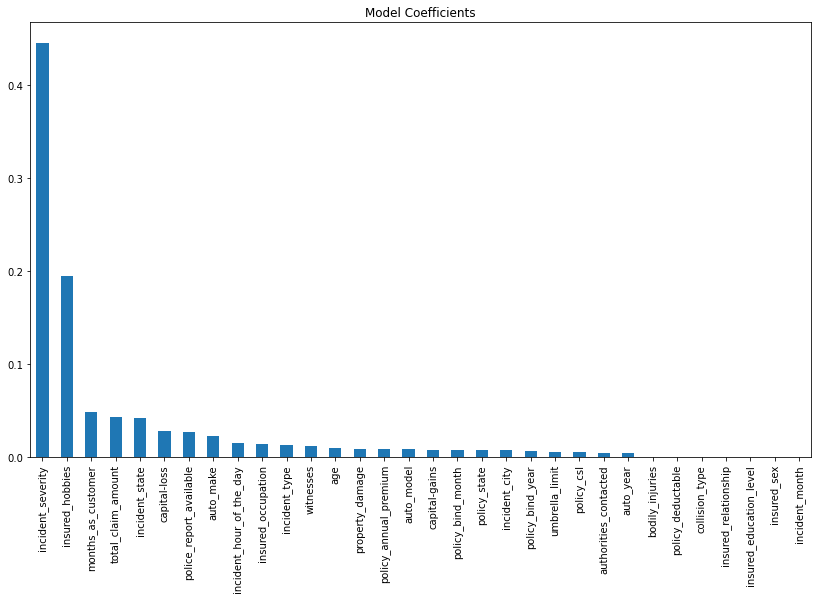

In [92]:
from sklearn.tree import DecisionTreeClassifier
dtc = DecisionTreeClassifier()
Model(dtc)
coef = pd.Series(dtc.feature_importances_,x.columns).sort_values(ascending=False)
coef.plot(kind= 'bar', title = 'Model Coefficients',figsize=(14,8))
plt.show()

Report for model RandomForestClassifier()
The Accuracy Score is 100.0
Confussion Matrix : 
 [[231   0]
 [  0 213]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       231
           1       1.00      1.00      1.00       213

    accuracy                           1.00       444
   macro avg       1.00      1.00      1.00       444
weighted avg       1.00      1.00      1.00       444

Cross Validation Score is  87.0945945945946

Difference between accuracy score and cv is 12.905405405405403


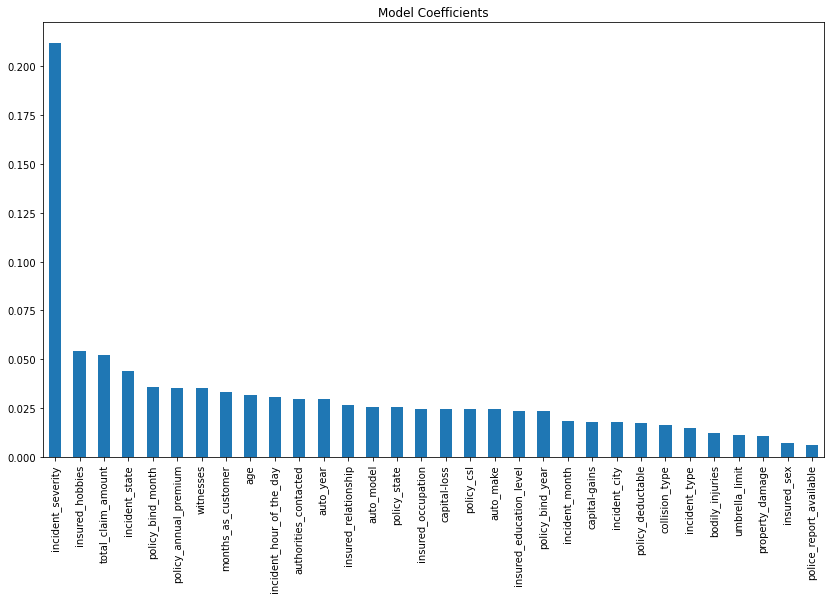

In [93]:
from sklearn.ensemble import RandomForestClassifier
rf = RandomForestClassifier()
Model(rf)
coef = pd.Series(rf.feature_importances_,x.columns).sort_values(ascending=False)
coef.plot(kind= 'bar', title = 'Model Coefficients',figsize=(14,8))
plt.show()

Report for model ExtraTreesClassifier()
The Accuracy Score is 100.0
Confussion Matrix : 
 [[231   0]
 [  0 213]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       231
           1       1.00      1.00      1.00       213

    accuracy                           1.00       444
   macro avg       1.00      1.00      1.00       444
weighted avg       1.00      1.00      1.00       444

Cross Validation Score is  90.67567567567568

Difference between accuracy score and cv is 9.324324324324323


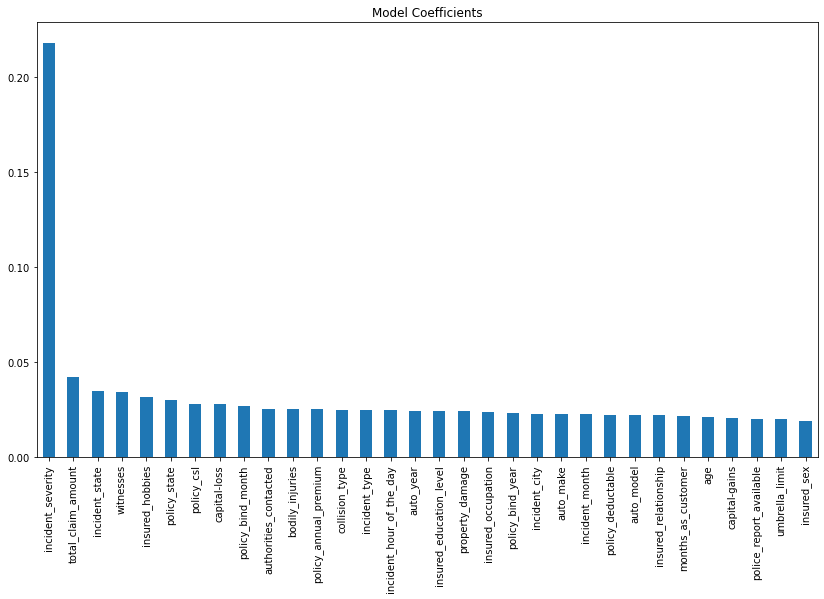

In [94]:
from sklearn.ensemble import ExtraTreesClassifier
et = ExtraTreesClassifier()
Model(et)
coef = pd.Series(et.feature_importances_,x.columns).sort_values(ascending=False)
coef.plot(kind= 'bar', title = 'Model Coefficients',figsize=(14,8))
plt.show()

Report for model AdaBoostClassifier()
The Accuracy Score is 95.04504504504504
Confussion Matrix : 
 [[220  11]
 [ 11 202]]
              precision    recall  f1-score   support

           0       0.95      0.95      0.95       231
           1       0.95      0.95      0.95       213

    accuracy                           0.95       444
   macro avg       0.95      0.95      0.95       444
weighted avg       0.95      0.95      0.95       444

Cross Validation Score is  84.32432432432432

Difference between accuracy score and cv is 10.72072072072072


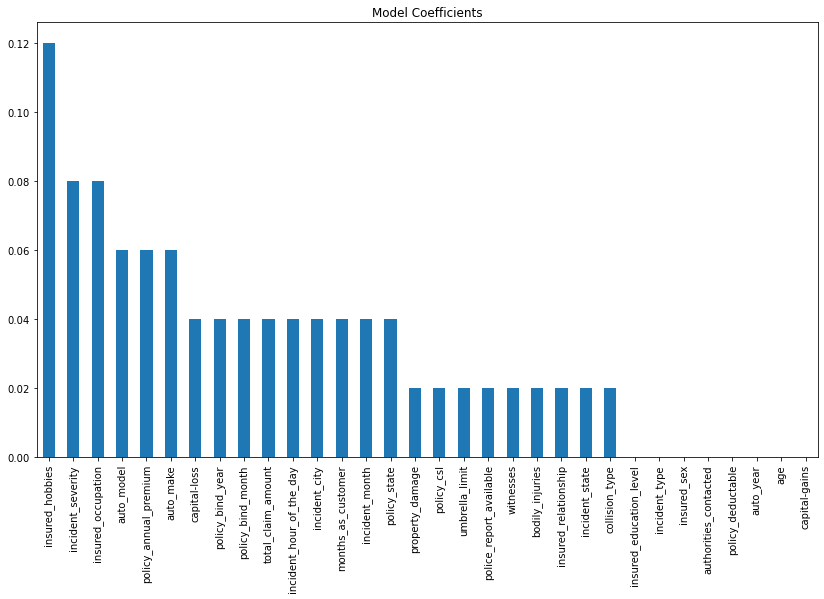

In [95]:
from sklearn.ensemble import AdaBoostClassifier
ad = AdaBoostClassifier()
Model(ad)
coef = pd.Series(ad.feature_importances_,x.columns).sort_values(ascending=False)
coef.plot(kind= 'bar', title = 'Model Coefficients',figsize=(14,8))
plt.show()

Report for model GradientBoostingClassifier()
The Accuracy Score is 100.0
Confussion Matrix : 
 [[231   0]
 [  0 213]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       231
           1       1.00      1.00      1.00       213

    accuracy                           1.00       444
   macro avg       1.00      1.00      1.00       444
weighted avg       1.00      1.00      1.00       444

Cross Validation Score is  87.02702702702703

Difference between accuracy score and cv is 12.972972972972968


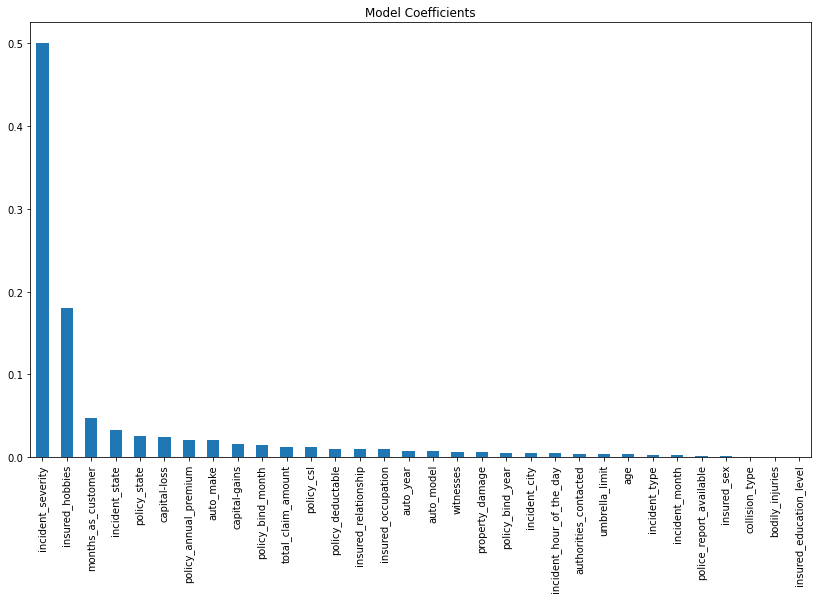

In [96]:
from sklearn.ensemble import GradientBoostingClassifier
gb = GradientBoostingClassifier()
Model(gb)
coef = pd.Series(gb.feature_importances_,x.columns).sort_values(ascending=False)
coef.plot(kind= 'bar', title = 'Model Coefficients',figsize=(14,8))
plt.show()

### 3 Best Models are :
    - LogisticRegression
    - KNeighborsClassifier
    - ExtraTreesClassifier

### HyperParameter Tuning

In [98]:
from sklearn.model_selection import GridSearchCV

In [99]:
lr = LogisticRegression()

parameters = {'penalty':['l1', 'l2', 'elasticnet', 'none'],'C':[0.001,0.0011,0.01,0.1,1,10],'solver':['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga']}
gcv = GridSearchCV(lr,parameters,cv=5,n_jobs=-1)
gcv.fit(x_train,y_train)
gcv.best_params_

{'C': 0.01, 'penalty': 'l1', 'solver': 'saga'}

In [100]:
gcv.best_estimator_

LogisticRegression(C=0.01, penalty='l1', solver='saga')

In [101]:
lr = LogisticRegression(C=0.01, penalty='l1', solver='saga')
Model(lr)

Report for model LogisticRegression(C=0.01, penalty='l1', solver='saga')
The Accuracy Score is 80.18018018018019
Confussion Matrix : 
 [[205  26]
 [ 62 151]]
              precision    recall  f1-score   support

           0       0.77      0.89      0.82       231
           1       0.85      0.71      0.77       213

    accuracy                           0.80       444
   macro avg       0.81      0.80      0.80       444
weighted avg       0.81      0.80      0.80       444

Cross Validation Score is  78.58108108108108

Difference between accuracy score and cv is 1.5990990990991065


In [111]:
knn = KNeighborsClassifier()
parameters = {'n_neighbors':list(range(5,15)),'weights':['uniform', 'distance'],'algorithm':['auto', 'ball_tree', 'kd_tree', 'brute'],'leaf_size':list(range(10,50,10))}
gcv = GridSearchCV(knn,parameters,cv=5,n_jobs=-1)
gcv.fit(x_train,y_train)
gcv.best_params_

{'algorithm': 'auto', 'leaf_size': 10, 'n_neighbors': 6, 'weights': 'uniform'}

In [112]:
gcv.best_estimator_

KNeighborsClassifier(leaf_size=10, n_neighbors=6)

In [113]:
knn = KNeighborsClassifier(leaf_size=10, n_neighbors=6)
Model(knn)

Report for model KNeighborsClassifier(leaf_size=10, n_neighbors=6)
The Accuracy Score is 79.95495495495496
Confussion Matrix : 
 [[164  67]
 [ 22 191]]
              precision    recall  f1-score   support

           0       0.88      0.71      0.79       231
           1       0.74      0.90      0.81       213

    accuracy                           0.80       444
   macro avg       0.81      0.80      0.80       444
weighted avg       0.81      0.80      0.80       444

Cross Validation Score is  71.41891891891892

Difference between accuracy score and cv is 8.536036036036037


In [114]:
et = ExtraTreesClassifier()

parameters = {'n_estimators':list(range(50,501,50)),
             'criterion':["gini", "entropy"],
             'max_features':["auto", "sqrt", "log2"],
             'min_samples_split':[2,3,4,5,6,7,8,9]
             }
gcv = GridSearchCV(et,parameters,cv=5,n_jobs=-1)
gcv.fit(x_train,y_train)
gcv.best_params_

{'criterion': 'entropy',
 'max_features': 'log2',
 'min_samples_split': 3,
 'n_estimators': 250}

In [115]:
gcv.best_estimator_

ExtraTreesClassifier(criterion='entropy', max_features='log2',
                     min_samples_split=3, n_estimators=250)

In [116]:
et = ExtraTreesClassifier(criterion='entropy', max_features='log2',
                     min_samples_split=3, n_estimators=250)
Model(et)

Report for model ExtraTreesClassifier(criterion='entropy', max_features='log2',
                     min_samples_split=3, n_estimators=250)
The Accuracy Score is 100.0
Confussion Matrix : 
 [[231   0]
 [  0 213]]
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       231
           1       1.00      1.00      1.00       213

    accuracy                           1.00       444
   macro avg       1.00      1.00      1.00       444
weighted avg       1.00      1.00      1.00       444

Cross Validation Score is  90.06756756756756

Difference between accuracy score and cv is 9.932432432432435


### Final Model : LogisticRegression with HyperParameter Tuning

In [117]:
lr = LogisticRegression(C=0.01, penalty='l1', solver='saga')
Model(lr)

Report for model LogisticRegression(C=0.01, penalty='l1', solver='saga')
The Accuracy Score is 80.18018018018019
Confussion Matrix : 
 [[205  26]
 [ 62 151]]
              precision    recall  f1-score   support

           0       0.77      0.89      0.82       231
           1       0.85      0.71      0.77       213

    accuracy                           0.80       444
   macro avg       0.81      0.80      0.80       444
weighted avg       0.81      0.80      0.80       444

Cross Validation Score is  78.58108108108108

Difference between accuracy score and cv is 1.5990990990991065


In [118]:
from sklearn.metrics import plot_precision_recall_curve

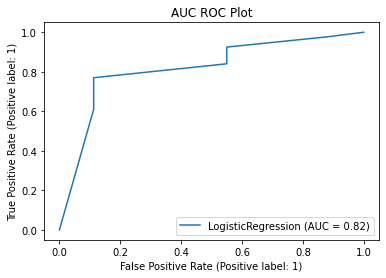

In [119]:
from sklearn.metrics import plot_roc_curve
plot_roc_curve(lr,x_test,y_test)
plt.title('AUC ROC Plot')
plt.show()

In [120]:
import pickle

file_name = 'Automobile_insurance_fraud.pkl'
pickle.dump(lr,open(file_name,'wb'))